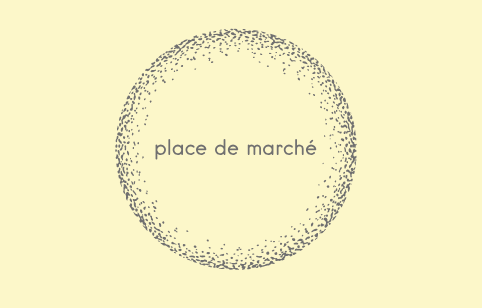

# Introduction - import packages and create text processing functions

In [1]:
# utilities
import sys
import datetime
from datetime import datetime
import random
import time
import logging
logging.disable(logging.WARNING) # disable WARNING, INFO and DEBUG logging everywhere
import os
os.environ["TF_KERAS"]='1'
os.environ["TF_XLA_FLAGS"] = "--tf_xla_enable_xla_devices=false"
os.environ["OMP_NUM_THREADS"] = '1'  # needed to avoid memory leak warning with K-Means in Windows environment

# data processing & cleaning
import pandas as pd
import numpy as np
import missingno as msno

# text processing
import re
import nltk
from nltk.tokenize import word_tokenize, RegexpTokenizer
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from collections import defaultdict
from nltk.stem import PorterStemmer, WordNetLemmatizer
from collections import Counter
from wordcloud import WordCloud

# data viz
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import plotly.express as px
from matplotlib.ticker import StrMethodFormatter
from matplotlib.ticker import FormatStrFormatter
# from jupyter_datatables import init_datatables_mode

# custom user functions
from functions import *

# serialization
import pickle

# modelisation
from sklearn import cluster, metrics, manifold, decomposition
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.manifold import TSNE
import umap
# import umap.plot
# import gensim
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text
import tensorflow.keras
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from transformers import BertTokenizer, BertModel, TFAutoModel, AutoTokenizer

# metrics
from sklearn.metrics import adjusted_rand_score
from tensorflow.keras import metrics as kmetrics

# set dataframe display options
pd.set_option('max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x) # Suppress scientific notation and show only 3 decimals
# pd.set_option('display.float_format', lambda x: '%.f' % x) # Suppress scientific notation and show only integer part

# silence warnings after checking
import warnings
# pd.set_option('future.no_silent_downcasting', False) # introduced in pandas 2.0.0., this notebook uses 1.4.4
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
# warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning) # introduced in pandas 2.0.0., this notebook uses 1.4.4

# extract colors from logo for ppt slideshow
# banana = findColor('banana.png')
# print("banana hex :", banana)
banana = '#fcf7c9'

viridis_sample = ['#481567FF','#453781FF','#39568CFF','#2D708EFF','#238A8DFF','#20A387FF','#3CBB75FF', '#73D055FF','#B8DE29FF']

viridis_palette = ['#440154', '#481e70', '#443982', '#3a528b', '#30678d', '#287b8e', '#20908c', '#20a485', '#35b778', '#5ec961',
                   '#90d643', '#c7e01f', '#fde724']

sunset_palette = ["#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00", "#FF5722", "#FF3D00", "#FF2D00",
                  "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081", "#F50057", "#D5006D", "#C51162"]

palette = ['#440154', '#481e70', '#443982', '#3a528b', '#30678d', '#287b8e', '#20908c', '#20a485', '#35b778', '#5ec961',
           '#90d643', '#c7e01f', '#fde724', "#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00",
           "#FF5722", "#FF3D00", "#FF2D00", "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081",
           "#F50057", "#D5006D", "#C51162"]

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


**-Check versions:**

In [ ]:
print(np.__version__, '\n')
# print(gensim.__version__, '\n')
print(tensorflow.__file__, '\n')
print(tf.__version__, '\n')
print(hasattr(tf, 'keras'), '\n')
print(type(tensorflow), '\n')
print(tensorflow.__spec__, '\n')
print(dir(tf.keras))  # should list keras submodules

1.23.5 

C:\Users\celin\DS Projets Python\OCDS-repos-all\OCDS-P6\venv39\lib\site-packages\tensorflow\__init__.py 

2.10.0 

True 

<class 'module'> 

ModuleSpec(name='tensorflow', loader=<_frozen_importlib_external.SourceFileLoader object at 0x0000019140A4E490>, origin='C:\\Users\\celin\\DS Projets Python\\OCDS-repos-all\\OCDS-P6\\venv39\\lib\\site-packages\\tensorflow\\__init__.py', submodule_search_locations=['C:\\Users\\celin\\DS Projets Python\\OCDS-repos-all\\OCDS-P6\\venv39\\lib\\site-packages\\tensorflow', 'C:\\Users\\celin\\DS Projets Python\\OCDS-repos-all\\OCDS-P6\\venv39\\lib\\site-packages\\tensorflow\\_api\\v2']) 

['Input', 'Model', 'Sequential', '__builtins__', '__cached__', '__doc__', '__file__', '__internal__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', '_sys', 'activations', 'applications', 'backend', 'callbacks', 'constraints', 'datasets', 'dtensor', 'estimator', 'experimental', 'initializers', 'layers', 'losses', 'metrics', 'mixe

**-Check if Tensorflow sees GPU (requires cuDNNv8.9.0 for CUDA 11.x and CUDA v11.8 :**

In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"TensorFlow detected {len(gpus)} GPU(s):")
    for gpu in gpus:
        print(f" - {gpu}")
else:
    print("TensorFlow did NOT detect any GPUs.")

TensorFlow detected 1 GPU(s):
 - PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.10.0
2.10.0
Num GPUs Available:  1
True


**- Text preparation functions :**

In [ ]:
def tokenize(word_string):
    tokenizer = RegexpTokenizer(r"[a-zA-Z]+")
    word_tokens = tokenizer.tokenize(word_string.lower())
    return word_tokens

def remove_stop_words(word_list):
    stop_words = list(set(stopwords.words('english')))
    filtered_words = [word for word in word_list if not word in stop_words]
    filtered_words_trim = [word for word in filtered_words if len(word) > 2]
    return filtered_words_trim

def lemmatize(word_list):
    lemmatizer = WordNetLemmatizer()
    lem_words = [lemmatizer.lemmatize(word) for word in word_list]
    return lem_words

def stem(word_list):
    stemmer = PorterStemmer()
    stem_words = [stemmer.stem(word) for word in word_list]
    return stem_words

def filter_words(word_list, words_to_trim):
    filtered_words = [word for word in word_list if not word in words_to_trim]
    return filtered_words

**- Graphing functions :**

In [ ]:
# recoloring function for wordclouds
def sunset_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return random.choice(sunset_palette)

# 1 - Data imports, cleaning & initial feature selection

## 1.1 - Import & describe data

In [ ]:
products_raw = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')
print(products_raw.shape)
# products_raw.head(1)

(1050, 15)


<AxesSubplot:>

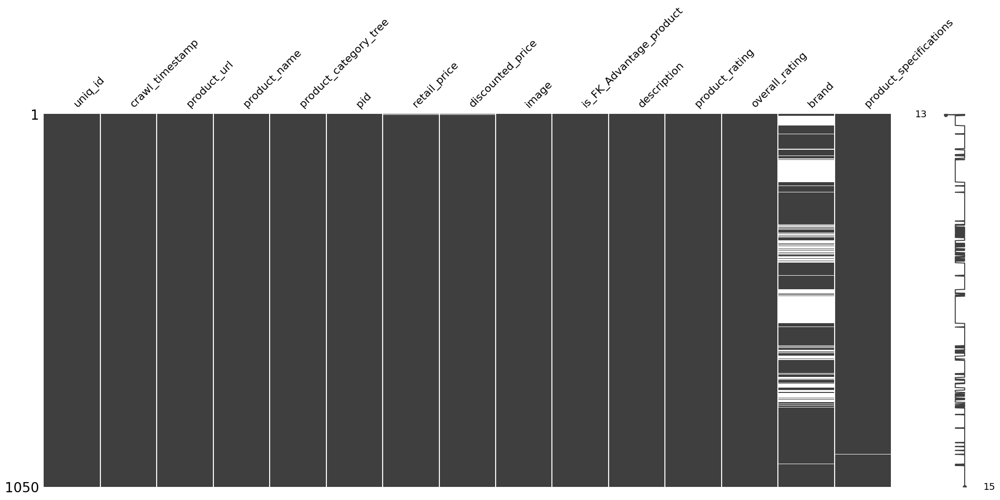

In [ ]:
msno.matrix(products_raw)

In [ ]:
# NaNs
print("NaNs: ", products_raw.isna().sum().sum() / (products_raw.shape[0] * products_raw.shape[1]))

NaNs:  0.02165079365079365


In [ ]:
products_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [ ]:
products_raw.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

**The brand column, when not empty, contains duplicate information (substring of product name column) and can therefore be dropped, as it does not add additional info. Products descriptions can be found in a combination of info from columns product_name, product_category_tree, image and description (column product_specifications contains partial and duplicated info from these columns so we do not keep it either).**

(1050, 4)


<AxesSubplot:>

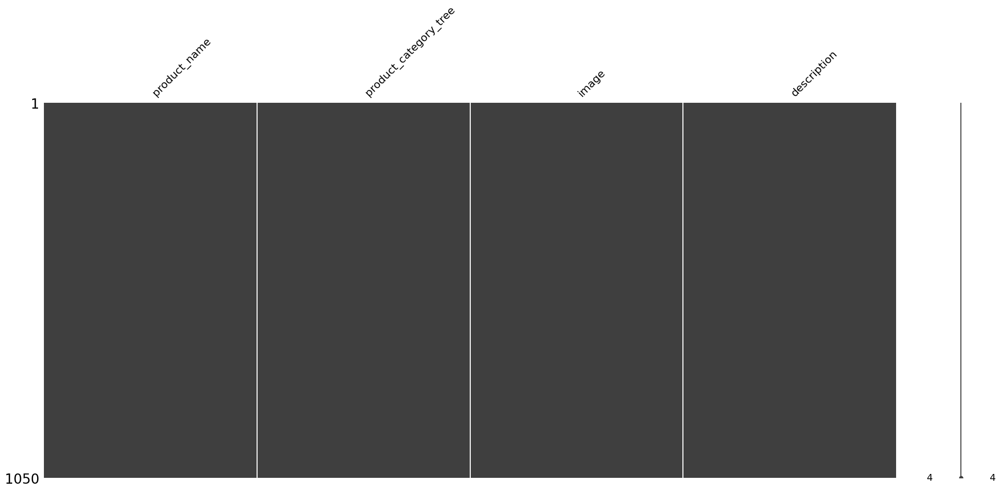

In [ ]:
products_trim = products_raw[['product_name', 'product_category_tree', 'image', 'description']]
print(products_trim.shape)
msno.matrix(products_trim)

In [ ]:
# NaNs
print("NaNs: ", products_trim.isna().sum().sum() / (products_raw.shape[0] * products_raw.shape[1]))

NaNs:  0.0


In [ ]:
products_trim.head(1)

,product_name,product_category_tree,image,description
0,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester"


## 1.2 - Clean text data

### 1.2.1 - Identify product categories

In [ ]:
# Analyse products diversity in each category
product_range = products_trim['product_category_tree'].apply(lambda x: x[2:-2]) # remove square brackets and quotation marks
products_trim[['product_category', 'product_sub_category',
               'product_range', 'product_name_short', 'product_description_short']] = product_range.str.split(pat='>> ', n=4, expand=True)
products_trim.describe().T

C:\Users\celin\AppData\Local\Temp\ipykernel_28968\2048398800.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products_trim[['product_category', 'product_sub_category',
C:\Users\celin\AppData\Local\Temp\ipykernel_28968\2048398800.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products_trim[['product_category', 'product_sub_category',
C:\Users\celin\AppData\Local\Temp\ipykernel_28968\2048398800.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

,count,unique,top,freq
product_name,1050,1050,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,1
product_category_tree,1050,642,"[""Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars""]",56
image,1050,1050,55b85ea15a1536d46b7190ad6fff8ce7.jpg,1
description,1050,1050,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",1
product_category,1050,7,Home Furnishing,150
product_sub_category,1050,63,Wrist Watches,149
product_range,1047,246,Deodorants,65
product_name_short,679,350,Combos,64
product_description_short,405,348,Denver Combos,8


In [ ]:
data_pie_1 = pd.DataFrame(products_trim['product_category'].value_counts())
data_pie_1

,count
product_category,
Home Furnishing,150
Baby Care,150
Watches,150
Home Decor & Festive Needs,150
Kitchen & Dining,150
Beauty and Personal Care,150
Computers,150


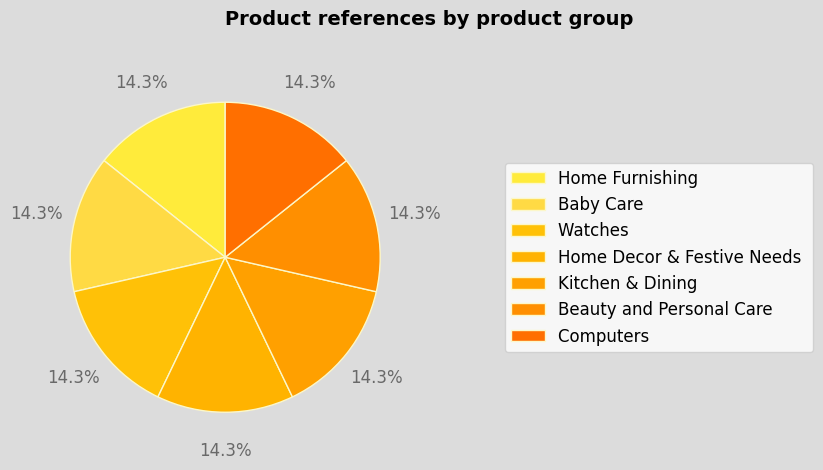

In [ ]:
# plot pie by pnns groups 1
data_pie_1 = products_trim['product_category'].value_counts()
fig, ax = plt.subplots(figsize=(5,7))
fig.set_facecolor('gainsboro')
ax.pie(data_pie_1, radius=1, colors=sunset_palette, autopct = '%1.1f%%', pctdistance=1.25,
       wedgeprops=dict(edgecolor=banana), textprops={'fontsize': 12, 'color':'dimgray'},startangle=90)
ax.legend(title="", loc="center left", bbox_to_anchor=(1.2, 0, 0.5, 1), fontsize=12, labels=data_pie_1.index)
plt.text(0, 1.5, "Product references by product group", fontsize=14, fontweight='bold', color='black')
plt.savefig("pie_1.png", bbox_inches='tight')
plt.show()

**Products are equally split between categories.**

In [ ]:
# keep only columns required for analysis
products_trim = products_trim[['product_category','description','image']]

### 1.2.2 - Corpus EDA

#### 1.2.2.1 - Raw corpus

In [ ]:
products_trim['corpus_raw'] = products_trim['description']

In [ ]:
products_trim['corpus_raw_word_count'] = products_trim['corpus_raw'].str.split().str.len()

In [ ]:
products_trim.head(1)

,product_category,description,image,corpus_raw,corpus_raw_word_count
0,Home Furnishing,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",230


In [ ]:
graph_data_1 = pd.DataFrame(products_trim.groupby('product_category')['corpus_raw_word_count'].mean())
graph_data_1

,corpus_raw_word_count
product_category,
Baby Care,78.673
Beauty and Personal Care,59.613
Computers,87.220
Home Decor & Festive Needs,91.440
Home Furnishing,60.793
Kitchen & Dining,104.507
Watches,51.173


In [ ]:
graph_data_1.columns

Index(['corpus_raw_word_count'], dtype='object')

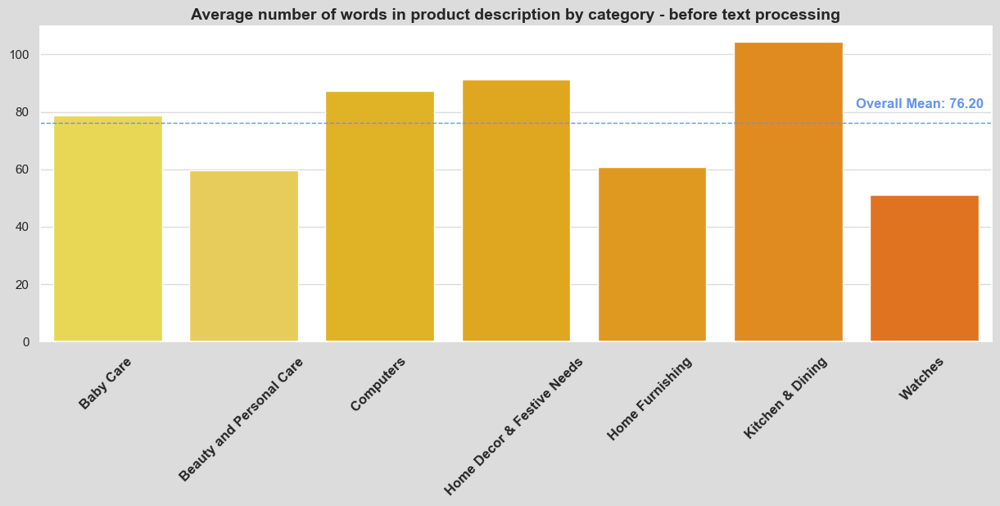

In [ ]:
# graph_data_1 = products_trim.groupby('product_category').agg({'corpus_raw_word_count' : 'mean', 'image': 'count'})
graph_data_1 = pd.DataFrame(products_trim.groupby('product_category')['corpus_raw_word_count'].mean())
sns.set(rc={'figure.figsize':(15, 5), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})
graph_1 = sns.barplot(data = graph_data_1, x=graph_data_1.index, y='corpus_raw_word_count', palette=sunset_palette)
plt.title('Average number of words in product description by category - before text processing', fontweight='bold', fontsize='14')
plt.xlabel('')
plt.xticks(rotation=45, fontweight='bold', fontsize='12')
mean_val_1 = products_trim['corpus_raw_word_count'].mean()
plt.axhline(y=mean_val_1, color='cornflowerblue', linestyle='--', linewidth=1)
plt.text(x=5.5, y=mean_val_1 + 5, s=f'Overall Mean: {mean_val_1:.2f}', color='cornflowerblue', fontsize=12, fontweight='bold')
plt.ylabel('')
plt.grid(axis='y', color='gainsboro')
plt.savefig("graph_1.png", bbox_inches='tight')

In [ ]:
graph_data_1

,corpus_raw_word_count
product_category,
Baby Care,78.673
Beauty and Personal Care,59.613
Computers,87.220
Home Decor & Festive Needs,91.440
Home Furnishing,60.793
Kitchen & Dining,104.507
Watches,51.173


In [ ]:
grouped_raw = pd.DataFrame(products_trim.groupby('product_category')['corpus_raw'].apply(lambda texts: [word for text in texts for word
                                                                                                    in str(text).split()])).reset_index()
grouped_raw

,product_category,corpus_raw
0,Baby Care,"[Specifications, of, Sathiyas, Cotton, Bath, Towel, (3, Bath, Towel,, Red,, Yellow,, Blue), Bath, Towel, Features, Machine, Washable, Yes, Material, Cotton, Design, Self, Design, General, Brand, Sathiyas, Type, Bath, Towel, GSM, 500, Model, Name, Sathiyas, cotton, bath, towel, Ideal, For, Men,, Women,, Boys,, Girls, Model, ID, asvtwl322, Color, Red,, Yellow,, Blue, Size, Mediam, Dimensions, Length, 30, inch, Width, 60, inch, In, the, Box, Number, of, Contents, in, Sales, Package, 3, Sales, Package, 3, Bath, Towel, Key, Features, of, Eurospa, Cotton, Terry, Face, Towel, Set, Size:, small, Height:, 9, inch, GSM:, 360,Eurospa, Cotton, Terry, Face, Towel, Set, (20, PIECE, FACE, TOWEL, SET,, ...]"
1,Beauty and Personal Care,"[Key, Features, of, Burt, s, Bees, Hair, Repair, Shea, And, Grapefruit, Deep, Conditioner, Ideal, For:, Boys,, Girls, Applied, For:, Deep, Conditioning, Hair, Condition:, Damaged, Hair, Hair, Type:, Dry, Hair,Specifications, of, Burt, s, Bees, Hair, Repair, Shea, And, Grapefruit, Deep, Conditioner, (147.5, ml), Conditioner, Traits, Hair, Condition, Damaged, Hair, Hair, Type, Dry, Hair, Applied, For, Deep, Conditioning, Ideal, For, Boys,, Girls, General, Traits, Brand, Burt, s, Bees, Quantity, 147.5, ml, Model, Name, Hair, Repair, Shea, And, Grapefruit, Deep, Conditioner, In, the, Box, 1, Conditioner, Key, Features, of, Suave, Naturals, Everlasting, Sunshine, Conditioner, Ideal, For:, Boys,, Girls, Applied, For:, Conditioning, Hair, Condition:, ...]"
2,Computers,"[Key, Features, of, D-Link, DAP1320, QRS, app(iOS,Android),Specifications, of, D-Link, DAP1320, (White), Speed, Wireless, Speed, 300, Mbps, DSL, Modem, Speed, 300, Mbps, General, Brand, D-Link, In, The, Box, Extender, Plug, Model, DAP1320, Type, Range, Extenders/Repeaters, Color, White, Warranty, Covered, in, Warranty, No, damage, Warranty, Summary, 3years, Service, Type, No, damage, Not, Covered, in, Warranty, damaged, will, not, repair, Dimensions, Weight, 69, g, Connectivity, Number, of, Antennae, 2, Number, of, USB, Ports, 0, Antennae, Internal, Supported, Protocols, Standard, IEEE, IEEE, 802.11n/g/b, Operating, Conditions, Operating, Humidity, Operating:, 10%, to, 90%, non-condensing, //, Storage:, 5%, to, 95%, non-condensing, Temperature, Operating:, 0, to, 40, °C, ...]"
3,Home Decor & Festive Needs,"[Myesquire, Ceramic, Burner, Pot, Lemongrass, Liquid, Air, Freshener, (30, ml), Price:, Rs., 245, Illuminate, Every, Corner, Of, Your, Living, Room, In, Style, With, This, Home, Fragrance, Electric, Burner, Combo, With, Fragrance, That, Is, Brought, To, You, By, Myesquire., This, Is, A, Very, Unique,, Useful, And, Value, for, Money, Product, For, Home, Decoration, And, Fragrance., This, Unique, Combo, Contains, Aroma, Burner, With, All, Accessories, and, is, ready, to, use, ., Put, A, Small, Amount, 1-2, Tea, Spoon, Of, Aroma, Oil, On, The, Bowl, Surface, And, Light, The, Tea, Light, and, After, Few, Minutes, As, The, Oil, Heats, Up,, The, Fragrance, Will, ...]"
4,Home Furnishing,"[Key, Features, of, Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Floral, Curtain,Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, (213, cm, in, Height,, Pack, of, 2), Price:, Rs., 899, This, curtain, enhances, the, look, of, the, interiors.This, curtain, is, made, from, 100%, high, quality, polyester, fabric.It, features, an, eyelet, style, stitch, with, Metal, Ring.It, makes, the, room, environment, romantic, and, loving.This, curtain, is, ant-, wrinkle, and, anti, shrinkage, and, have, elegant, apparance.Give, your, home, a, bright, and, modernistic, appeal, with, these, designs., The, surreal, attention, is, sure, to, steal, hearts., These, contemporary, eyelet, and, valance, curtains, slide, smoothly, so, when, you, ...]"
5,Kitchen & Dining,"[Key, Features, of, Dungri, India, Craft, Ducjug010-ducgl012-2, Jug, Glass, Set, Jug:, Height-, 8, inches,, Dia, -, 4.2, inches,, Depth, 7.5, inches,, Wi

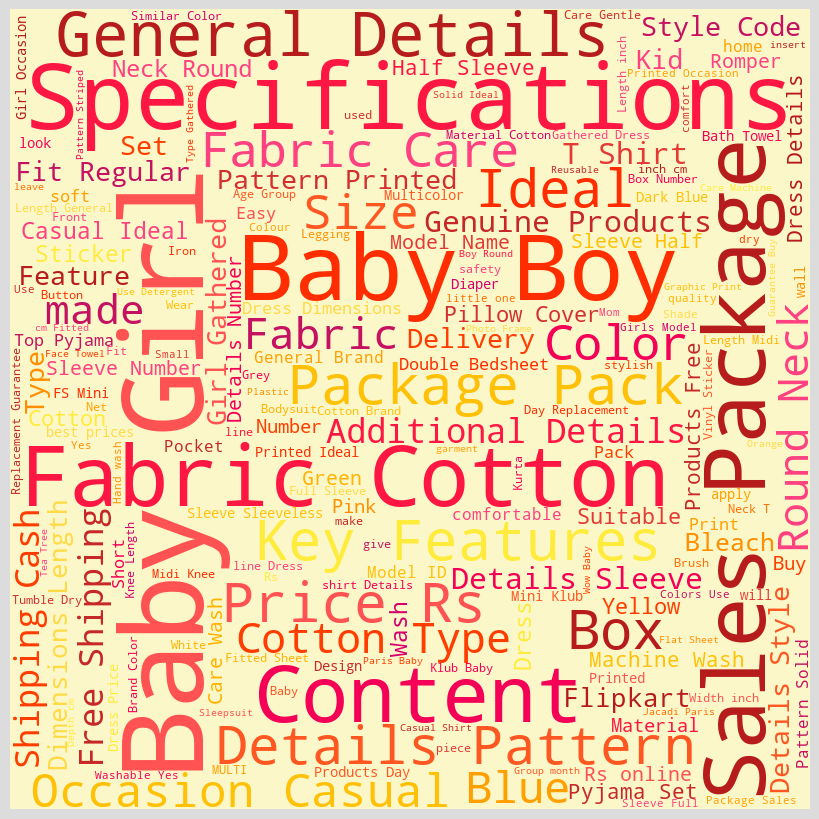

In [ ]:
baby_care_words_raw = grouped_raw.iloc[0,1]
wordcloud_0 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(baby_care_words_raw))
wordcloud_0 = wordcloud_0.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_0)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

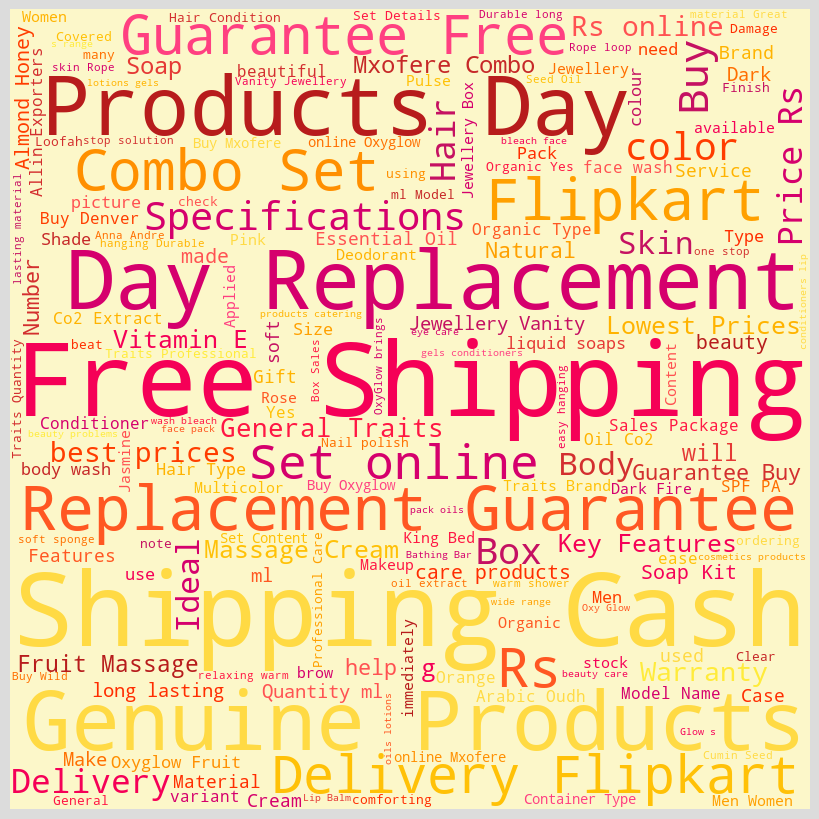

In [ ]:
beauty_words_raw = grouped_raw.iloc[1,1]
wordcloud_1 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(beauty_words_raw))
wordcloud_1 = wordcloud_1.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

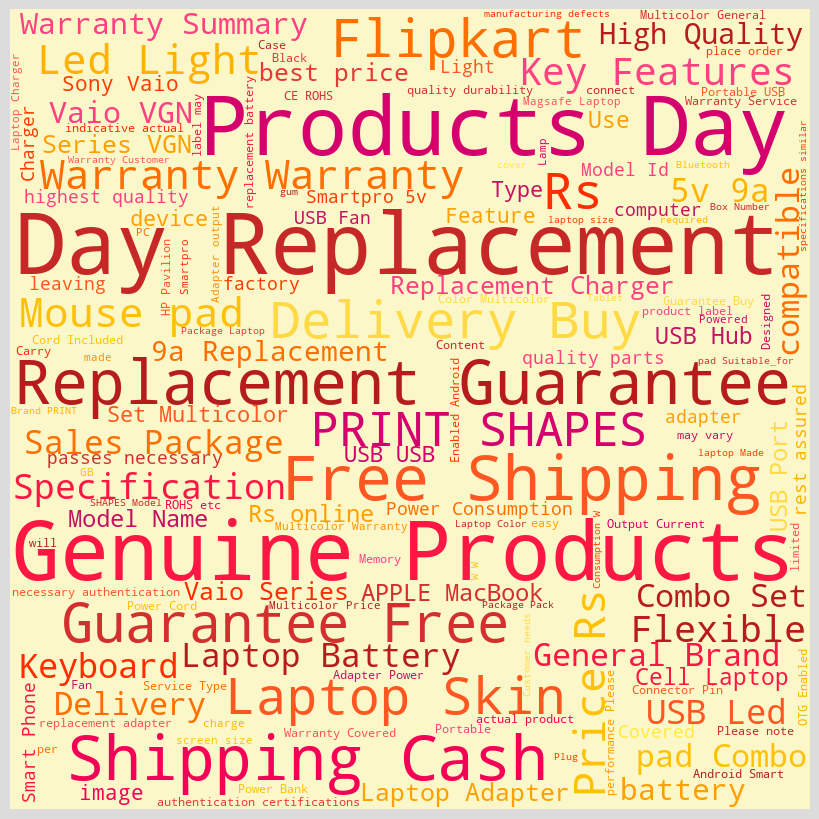

In [ ]:
computers_words_raw = grouped_raw.iloc[2,1]
wordcloud_2 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(computers_words_raw))
wordcloud_2 = wordcloud_2.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_2)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

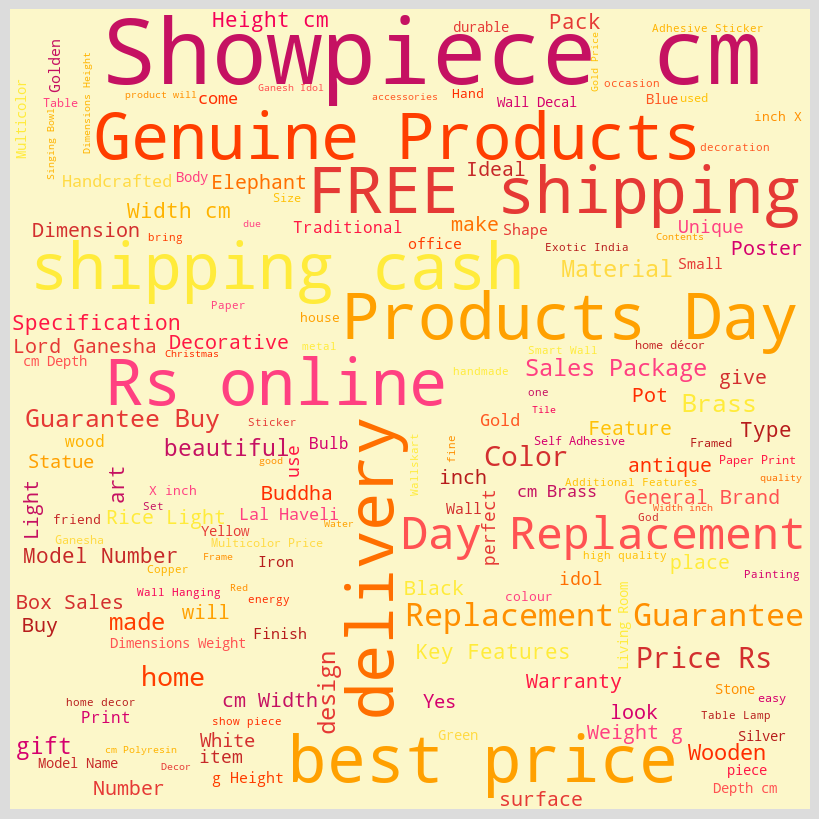

In [ ]:
home_decor_words_raw = grouped_raw.iloc[3,1]
wordcloud_3 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(home_decor_words_raw))
wordcloud_3 = wordcloud_3.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_3)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

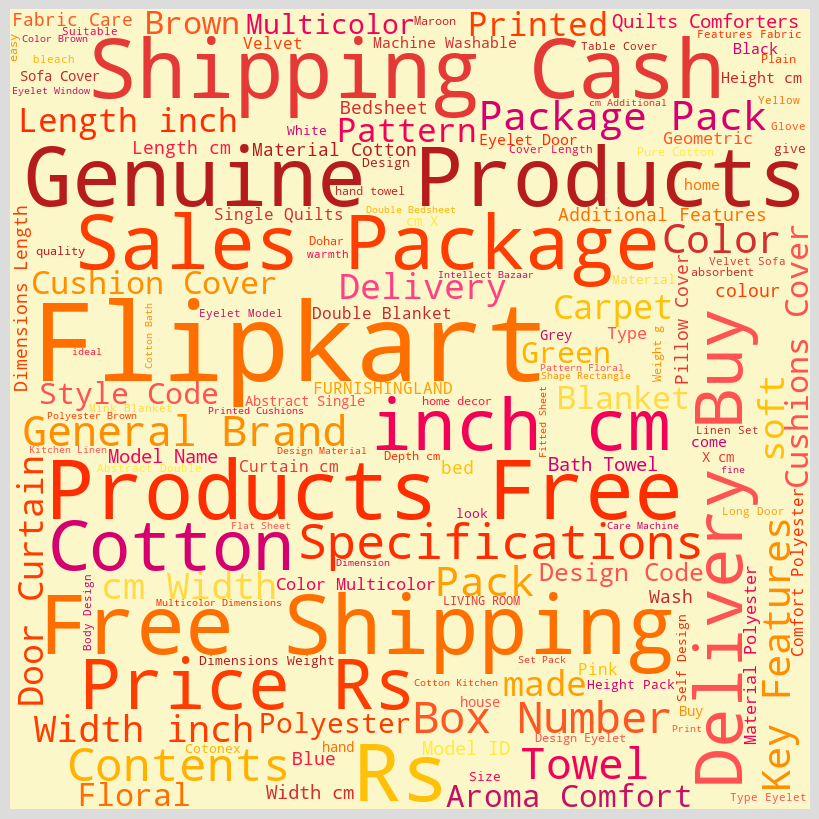

In [ ]:
home_furn_words_raw = grouped_raw.iloc[4,1]
wordcloud_4 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(home_furn_words_raw))
wordcloud_4 = wordcloud_4.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_4)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

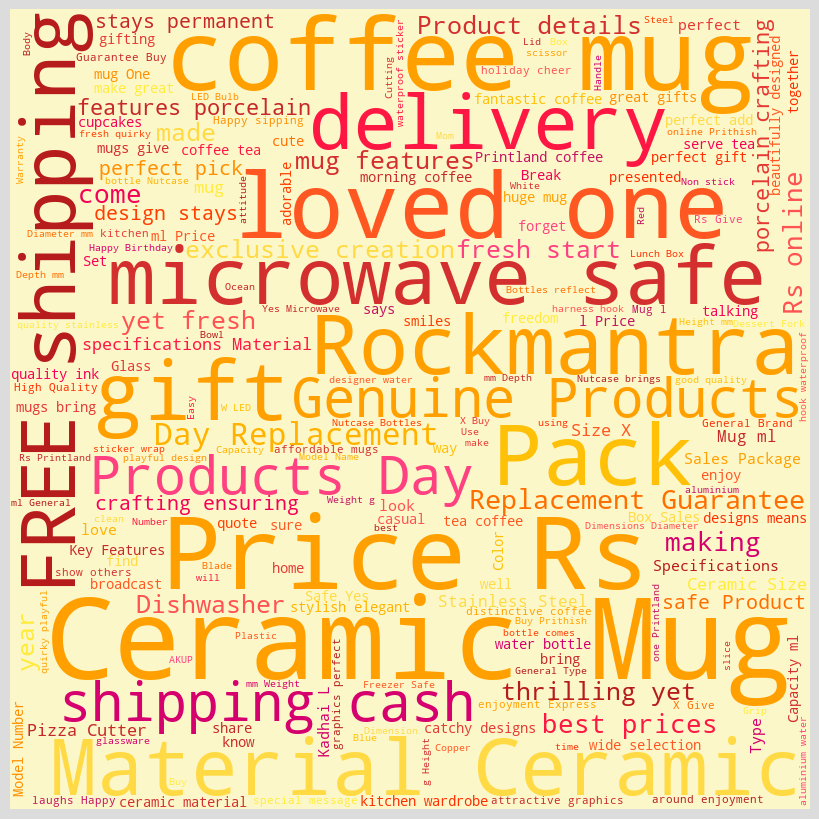

In [ ]:
kitchen_words_raw = grouped_raw.iloc[5,1]
wordcloud_5 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(kitchen_words_raw))
wordcloud_5 = wordcloud_5.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_5)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

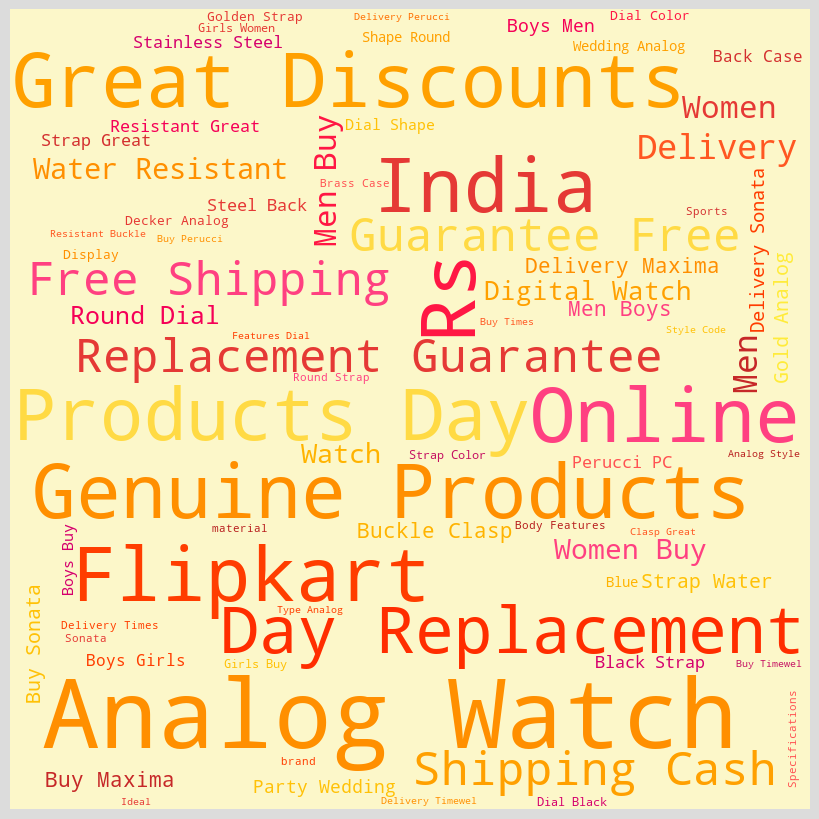

In [ ]:
watches_words_raw = grouped_raw.iloc[6,1]
wordcloud_6 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(watches_words_raw))
wordcloud_6 = wordcloud_6.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_6)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

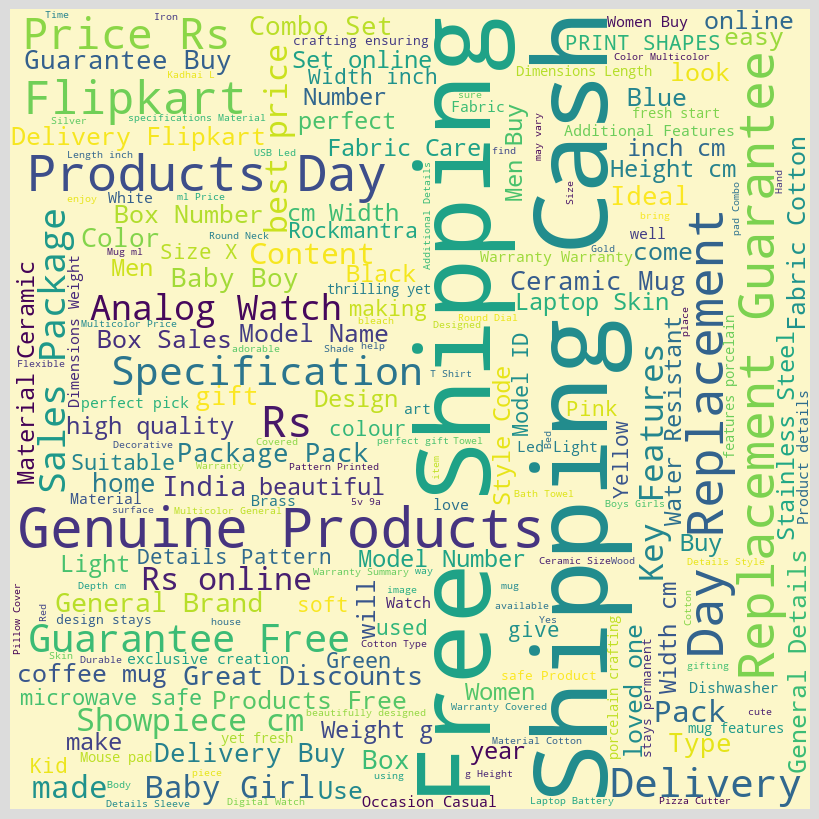

In [ ]:
words_raw_all = baby_care_words_raw + beauty_words_raw + computers_words_raw + home_decor_words_raw \
+ home_furn_words_raw + kitchen_words_raw + watches_words_raw
wordcloud_7 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(words_raw_all))
# wordcloud_6 = wordcloud_6.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_7)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

**Whether globally or by category, a lot of the most commonly used words are generic and do not convey any specific information pertaining to the product category.**

#### 1.2.2.2 - Tokenize corpus

In [ ]:
products_trim['corpus_trim'] = products_trim['corpus_raw'].apply(tokenize)

In [ ]:
type(products_trim['corpus_trim'][0])

list

In [ ]:
products_trim['corpus_trim_word_count'] = products_trim['corpus_trim'].apply(len)
# products_trim.head(1)

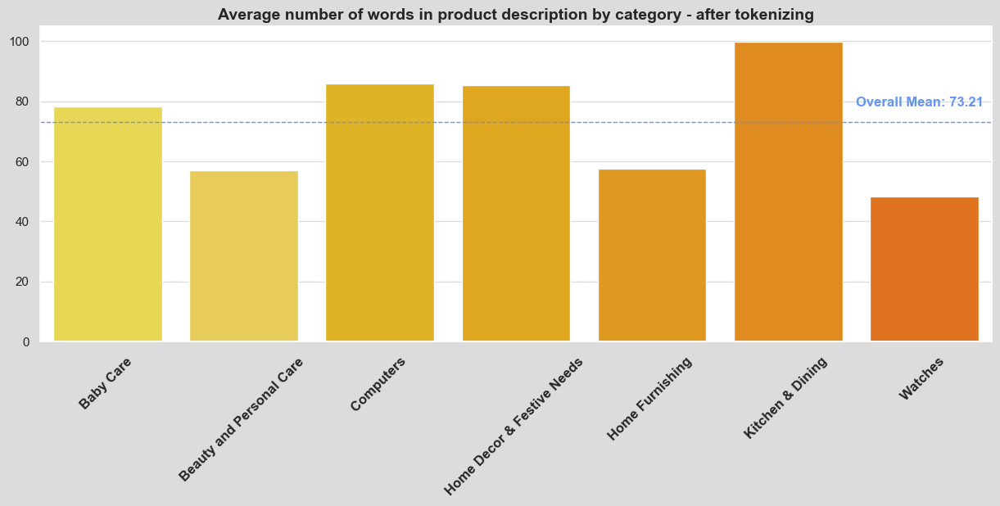

In [ ]:
graph_data_2 = pd.DataFrame(products_trim.groupby('product_category')['corpus_trim_word_count'].mean())
sns.set(rc={'figure.figsize':(15, 5), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})
graph_1 = sns.barplot(data = graph_data_2, x=graph_data_2.index, y='corpus_trim_word_count', palette=sunset_palette)
plt.title('Average number of words in product description by category - after tokenizing', fontweight='bold', fontsize='14')
plt.xlabel('')
plt.xticks(rotation=45, fontweight='bold', fontsize='12')
mean_val_2 = products_trim['corpus_trim_word_count'].mean()
plt.axhline(y=mean_val_2, color='cornflowerblue', linestyle='--', linewidth=1)
plt.text(x=5.5, y=mean_val_2 + 5, s=f'Overall Mean: {mean_val_2:.2f}', color='cornflowerblue', fontsize=12, fontweight='bold')
plt.ylabel('')
plt.grid(axis='y', color='gainsboro')
plt.savefig("graph_2.png", bbox_inches='tight')

#### 1.2.2.3 - Remove stop words

In [ ]:
products_trim['corpus_trim'] = products_trim['corpus_trim'].apply(remove_stop_words)
products_trim['corpus_trim_word_count'] = products_trim['corpus_trim'].apply(len)

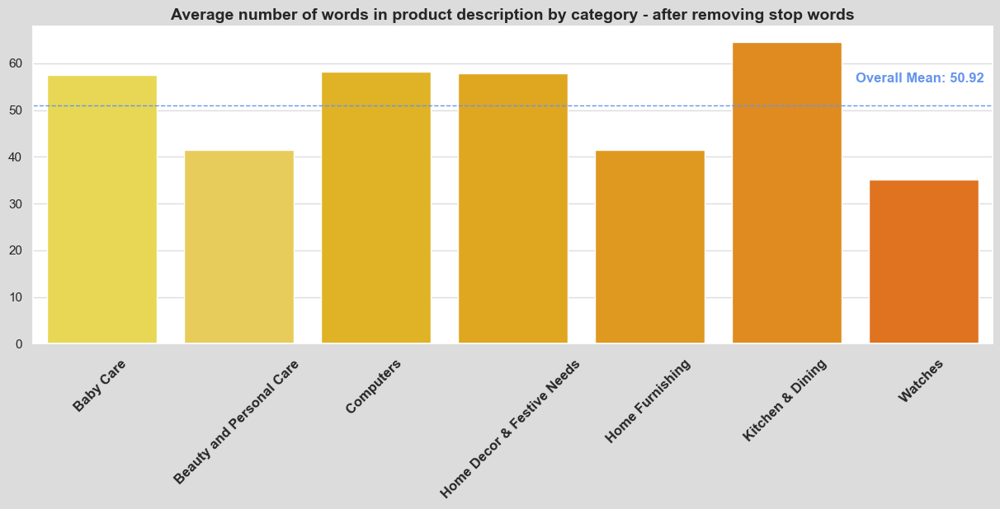

In [ ]:
graph_data_3 = pd.DataFrame(products_trim.groupby('product_category')['corpus_trim_word_count'].mean())
sns.set(rc={'figure.figsize':(15, 5), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})
graph_3 = sns.barplot(data = graph_data_3, x=graph_data_3.index, y='corpus_trim_word_count', palette=sunset_palette)
plt.title('Average number of words in product description by category - after removing stop words', fontweight='bold', fontsize='14')
plt.xlabel('')
plt.xticks(rotation=45, fontweight='bold', fontsize='12')
mean_val_3 = products_trim['corpus_trim_word_count'].mean()
plt.axhline(y=mean_val_3, color='cornflowerblue', linestyle='--', linewidth=1)
plt.text(x=5.5, y=mean_val_3 + 5, s=f'Overall Mean: {mean_val_3:.2f}', color='cornflowerblue', fontsize=12, fontweight='bold')
plt.ylabel('')
plt.grid(axis='y', color='gainsboro')
plt.savefig("graph_3.png", bbox_inches='tight')

#### 1.2.2.4 - Lemmatize corpus

In [ ]:
products_trim['corpus_trim'] = products_trim['corpus_trim'].apply(lemmatize)
products_trim['corpus_trim_word_count'] = products_trim['corpus_trim'].apply(len)

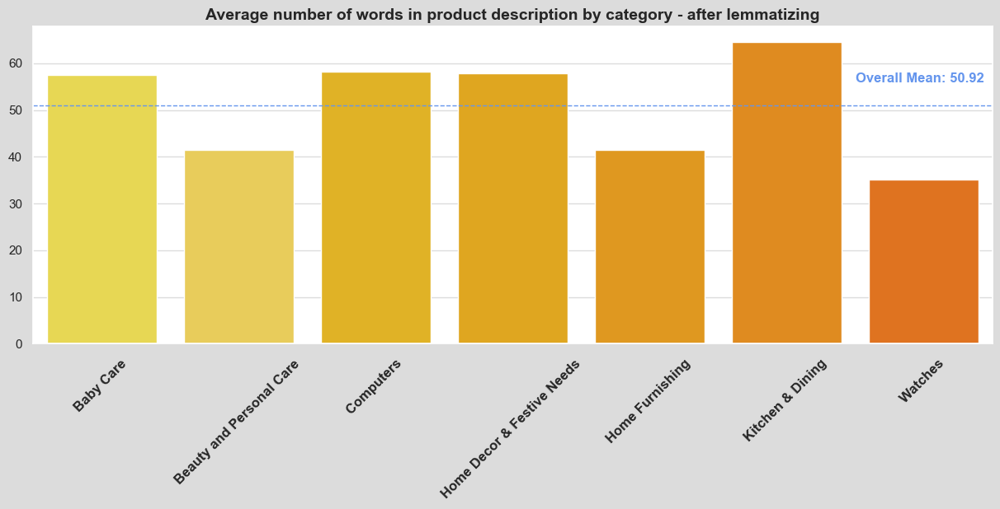

In [ ]:
graph_data_4 = pd.DataFrame(products_trim.groupby('product_category')['corpus_trim_word_count'].mean())
sns.set(rc={'figure.figsize':(15, 5), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})
graph_4 = sns.barplot(data = graph_data_4, x=graph_data_4.index, y='corpus_trim_word_count', palette=sunset_palette)
plt.title('Average number of words in product description by category - after lemmatizing', fontweight='bold', fontsize='14')
plt.xlabel('')
plt.xticks(rotation=45, fontweight='bold', fontsize='12')
mean_val_4 = products_trim['corpus_trim_word_count'].mean()
plt.axhline(y=mean_val_4, color='cornflowerblue', linestyle='--', linewidth=1)
plt.text(x=5.5, y=mean_val_4 + 5, s=f'Overall Mean: {mean_val_4:.2f}', color='cornflowerblue', fontsize=12, fontweight='bold')
plt.ylabel('')
plt.grid(axis='y', color='gainsboro')
plt.savefig("graph_4.png", bbox_inches='tight')

In [ ]:
products_trim.head(1)

,product_category,description,image,corpus_raw,corpus_raw_word_count,corpus_trim,corpus_trim_word_count
0,Home Furnishing,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",230,"[key, feature, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhances, look, interior, curtain, made, high, quality, polyester, fabric, feature, eyelet, style, stitch, metal, ring, make, room, environment, romantic, loving, curtain, ant, wrinkle, anti, shrinkage, elegant, apparance, give, home, bright, modernistic, appeal, design, surreal, attention, sure, steal, heart, contemporary, eyelet, valance, curtain, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, ray, want, wish, good, morning, whole, world, draw, close, evening, create, special, moment, joyous, beauty, given, soothing, print, bring, home, elegant, curtain, softly, filter, light, room, ...]",147


#### 1.2.2.5 - Indentify & remove non-informative words

In [ ]:
grouped_trim = pd.DataFrame(products_trim.groupby('product_category')['corpus_trim'].apply(lambda lists: [word for sublist in lists
                                                                                                          for word in sublist])).reset_index()
grouped_trim

,product_category,corpus_trim
0,Baby Care,"[specification, sathiyas, cotton, bath, towel, bath, towel, red, yellow, blue, bath, towel, feature, machine, washable, yes, material, cotton, design, self, design, general, brand, sathiyas, type, bath, towel, gsm, model, name, sathiyas, cotton, bath, towel, ideal, men, woman, boy, girl, model, asvtwl, color, red, yellow, blue, size, mediam, dimension, length, inch, width, inch, box, number, content, sale, package, sale, package, bath, towel, key, feature, eurospa, cotton, terry, face, towel, set, size, small, height, inch, gsm, eurospa, cotton, terry, face, towel, set, piece, face, towel, set, assorted, price, eurospa, brings, exclusively, designed, soft, cotton, towel, export, quality, product, soft, texture, take, care, ...]"
1,Beauty and Personal Care,"[key, feature, burt, bee, hair, repair, shea, grapefruit, deep, conditioner, ideal, boy, girl, applied, deep, conditioning, hair, condition, damaged, hair, hair, type, dry, hair, specification, burt, bee, hair, repair, shea, grapefruit, deep, conditioner, conditioner, trait, hair, condition, damaged, hair, hair, type, dry, hair, applied, deep, conditioning, ideal, boy, girl, general, trait, brand, burt, bee, quantity, model, name, hair, repair, shea, grapefruit, deep, conditioner, box, conditioner, key, feature, suave, natural, everlasting, sunshine, conditioner, ideal, boy, girl, applied, conditioning, hair, condition, damaged, hair, hair, type, dry, hair, specification, suave, natural, everlasting, sunshine, conditioner, conditioner, trait, hair, condition, damaged, hair, hair, type, dry, ...]"
2,Computers,"[key, feature, link, dap, qrs, app, io, android, specification, link, dap, white, speed, wireless, speed, mbps, dsl, modem, speed, mbps, general, brand, link, box, extender, plug, model, dap, type, range, extenders, repeater, color, white, warranty, covered, warranty, damage, warranty, summary, year, service, type, damage, covered, warranty, damaged, repair, dimension, weight, connectivity, number, antenna, number, usb, port, antenna, internal, supported, protocol, standard, ieee, ieee, operating, condition, operating, humidity, operating, non, condensing, storage, non, condensing, temperature, operating, storage, degree, additional, feature, certification, fcc, key, feature, roq, slim, multimedia, key, flexible, wired, usb, flexible, keyboard, size, handheld, roq, slim, multimedia, key, flexible, wired, ...]"
3,Home Decor & Festive Needs,"[myesquire, ceramic, burner, pot, lemongrass, liquid, air, freshener, price, illuminate, every, corner, living, room, style, home, fragrance, electric, burner, combo, fragrance, brought, myesquire, unique, useful, value, money, product, home, decoration, fragrance, unique, combo, contains, aroma, burner, accessory, ready, use, put, small, amount, tea, spoon, aroma, oil, bowl, surface, light, tea, light, minute, oil, heat, fragrance, spread, room, set, enjoy, captivating, aroma, keep, away, child, surface, becomes, hot, illuminate, every, corner, living, room, style, home, fragrance, electric, burner, combo, fragrance, brought, myesquire, unique, useful, value, money, product, home, decoration, fragrance, unique, combo, contains, aroma, burner, accessory, ready, use, put, small, amount, ...]"
4,Home Furnishing,"[key, feature, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhances, look, interior, curtain, made, high, quality, polyester, fabric, feature, eyelet, style, stitch, metal, ring, make, room, environment, romantic, loving, curtain, ant, wrinkle, anti, shrinkage, elegant, apparance, give, home, bright, modernistic, appeal, design, surreal, attention, sure, steal, heart, contemporary, eyelet, valance, curtain, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, ray, want, wish, good, morning, whole, world, draw, close, evening, create

In [ ]:
baby_care_words_trim  = grouped_trim.iloc[0,1]
beauty_words_trim  = grouped_trim.iloc[1,1]
computers_words_trim  = grouped_trim.iloc[2,1]
home_decor_words_trim = grouped_trim.iloc[3,1]
home_furn_words_trim  = grouped_trim.iloc[4,1]
kitchen_words_trim  = grouped_trim.iloc[5,1]
watches_words_trim = grouped_trim.iloc[6,1]

In [ ]:
words_trim_all = baby_care_words_trim + beauty_words_trim + computers_words_trim + home_decor_words_trim \
+ home_furn_words_trim + kitchen_words_trim + watches_words_trim

In [ ]:
word_freqs = pd.DataFrame(pd.Series(words_trim_all).value_counts()).reset_index()
print(word_freqs.shape)
word_freqs.head(15)

(4497, 2)


,index,count
0,product,864
1,free,618
2,buy,581
3,delivery,567
4,genuine,564
5,cash,564
6,shipping,564
7,price,561
8,replacement,559
9,day,553


**The 1st word with informative content appears on line 14 ('mug'), all preceding words are removed.**

In [ ]:
common_words = word_freqs.iloc[:13]['index'].tolist()
common_words

['product',
 'free',
 'buy',
 'delivery',
 'genuine',
 'cash',
 'shipping',
 'price',
 'replacement',
 'day',
 'flipkart',
 'com',
 'guarantee']

In [ ]:
word_freqs = word_freqs.rename(columns={'index':'word', 0: 'count'})
unique_words = word_freqs.loc[word_freqs['count'] == 1]['word'].tolist()
print(len(unique_words))
# unique_words

1298


**- Additional common words noticed on wordclouds:**

In [ ]:
other_common_words = ['weight', 'width', 'length', 'sale', 'type', 'number', 'warranty', 'quality', 'inch', 'brand', 'package', 'specification',
                      'feature', 'model', 'material', 'additional', 'key', 'color', 'general', 'detail', 'offering', 'discount', 'ideal',
                     'best', 'height', 'available', 'order', 'good', 'shape', 'make', 'colour', 'come', 'yet']

In [ ]:
words_to_trim = unique_words + common_words + other_common_words

In [ ]:
products_trim['corpus_trim'] = products_trim['corpus_trim'].apply(lambda word_list: filter_words(word_list, words_to_trim=words_to_trim))
products_trim['corpus_trim_word_count'] = products_trim['corpus_trim'].apply(len)
products_trim['corpus_trim_unique_words'] = products_trim['corpus_trim'].apply(lambda x: len(set(x)))

In [ ]:
products_trim.sample(3)

,product_category,description,image,corpus_raw,corpus_raw_word_count,corpus_trim,corpus_trim_word_count,corpus_trim_unique_words
199,Kitchen & Dining,"Step4deal Wheel Pizza Cutter (Stainless Steel Pack of 1)\r\n Price: Rs. 139\r\n\t\t\t\t\r\n\t\t\tEnjoy a delicious slice of pizza at home with this Pizza Cutter. It is made of stainless steel, this siver coloured pizza cutter will help cut pizza slices in one go. If your pizza-crazy kids make a big fuss about getting an equal share of their favourite deliacy, then this pizza cutter is a must have for your kitchen.\r\nEnjoy a delicious slice of pizza at home with this Pizza Cutter. It is made of stainless steel, this siver coloured pizza cutter will help cut pizza slices in one go. If your pizza-crazy kids make a big fuss about getting an equal share of their favourite deliacy, then this pizza cutter is a must have for your kitchen.",90f86ac4065397340e8012261577c220.jpg,"Step4deal Wheel Pizza Cutter (Stainless Steel Pack of 1)\r\n Price: Rs. 139\r\n\t\t\t\t\r\n\t\t\tEnjoy a delicious slice of pizza at home with this Pizza Cutter. It is made of stainless steel, this siver coloured pizza cutter will help cut pizza slices in one go. If your pizza-crazy kids make a big fuss about getting an equal share of their favourite deliacy, then this pizza cutter is a must have for your kitchen.\r\nEnjoy a delicious slice of pizza at home with this Pizza Cutter. It is made of stainless steel, this siver coloured pizza cutter will help cut pizza slices in one go. If your pizza-crazy kids make a big fuss about getting an equal share of their favourite deliacy, then this pizza cutter is a must have for your kitchen.",130,"[step, deal, wheel, pizza, cutter, stainless, steel, pack, enjoy, delicious, slice, pizza, home, pizza, cutter, made, stainless, steel, siver, coloured, pizza, cutter, help, cut, pizza, slice, one, pizza, crazy, kid, big, fuss, getting, equal, share, favourite, deliacy, pizza, cutter, must, kitchen, enjoy, delicious, slice, pizza, home, pizza, cutter, made, stainless, steel, siver, coloured, pizza, cutter, help, cut, pizza, slice, one, pizza, crazy, kid, big, fuss, getting, equal, share, favourite, deliacy, pizza, cutter, must, kitchen]",74,29
674,Home Furnishing,Buy Home Fashion Gallery Polyester Black Plain Eyelet Door Curtain at Rs. 1499 at Flipkart.com. Only Genuine Products. Free Shipping. Cash On Delivery!,2bf0ca6d25501c067cd12a2a4939443f.jpg,Buy Home Fashion Gallery Polyester Black Plain Eyelet Door Curtain at Rs. 1499 at Flipkart.com. Only Genuine Products. Free Shipping. Cash On Delivery!,23,"[home, fashion, gallery, polyester, black, plain, eyelet, door, curtain]",9,9
376,Beauty and Personal Care,Flipkart.com: Buy Denver Hamilton Pride Combo Set online only for Rs. 350 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!,15f45d08050e8ba24a14804cba000589.jpg,Flipkart.com: Buy Denver Hamilton Pride Combo Set online only for Rs. 350 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!,26,"[denver, hamilton, pride, combo, set, online]",6,6


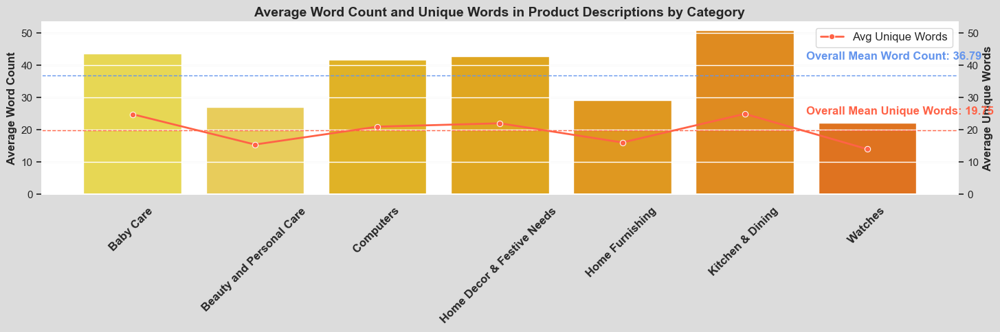

In [ ]:
avg_word_count = products_trim.groupby('product_category')['corpus_trim_word_count'].mean().reset_index()
avg_unique_words = products_trim.groupby('product_category')['corpus_trim_unique_words'].mean().reset_index()

sns.set(rc={'figure.figsize':(15, 5), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})
fig, ax = plt.subplots(figsize=(15, 5))

# Barplot for average word count
sns.barplot(data=avg_word_count, x='product_category', y='corpus_trim_word_count', palette=sunset_palette, ax=ax)

# Secondary y-axis for average unique words
ax2 = ax.twinx()

sns.lineplot(data=avg_unique_words, x='product_category', y='corpus_trim_unique_words', color='tomato', marker='o', linewidth=2,
             label='Avg Unique Words', ax=ax2)

# Synchronize y-axis ticks and limits
ticks = ax.get_yticks()
ax2.set_yticks(ticks)
ax2.set_ylim(ax.get_ylim())

# Labels and title
ax.set_title('Average Word Count and Unique Words in Product Descriptions by Category', fontweight='bold', fontsize=14)
ax.set_xlabel('')
ax.set_ylabel('Average Word Count', fontsize=12, fontweight='bold')
ax2.set_ylabel('Average Unique Words', fontsize=12, fontweight='bold')

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontweight='bold', fontsize=12)
ax.grid(axis='y', color='gainsboro')

ax2.legend(loc='upper right', fontsize=12)

# Overall means
mean_val_word_count = products_trim['corpus_trim_word_count'].mean()
mean_val_unique_words = products_trim['corpus_trim_unique_words'].mean()

# Horizontal line for corpus_trim_word_count mean
plt.axhline(y=mean_val_word_count, color='cornflowerblue', linestyle='--', linewidth=1)
plt.text(x=5.5, y=mean_val_word_count + 5, s=f'Overall Mean Word Count: {mean_val_word_count:.2f}',
         color='cornflowerblue', fontsize=12, fontweight='bold')

# Horizontal line for corpus_trim_unique_words mean
plt.axhline(y=mean_val_unique_words, color='tomato', linestyle='--', linewidth=1)
plt.text(x=5.5, y=mean_val_unique_words + 5, s=f'Overall Mean Unique Words: {mean_val_unique_words:.2f}',
         color='tomato', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig("graph_5_with_lines.png", bbox_inches='tight')
plt.show()

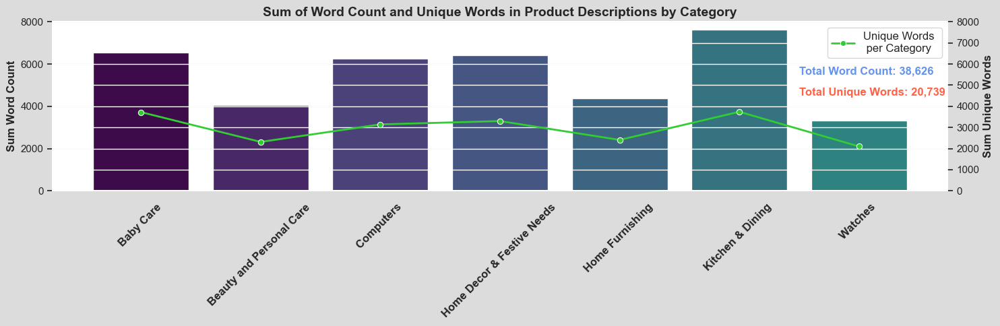

In [ ]:
# Calculate sum of word count and unique words by category
sum_word_count = products_trim.groupby('product_category')['corpus_trim_word_count'].sum().reset_index()
sum_unique_words = products_trim.groupby('product_category')['corpus_trim_unique_words'].sum().reset_index()

sns.set(rc={'figure.figsize':(15, 5), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})

fig, ax = plt.subplots(figsize=(15, 5))

# Barplot for sum of word count
sns.barplot(
    data=sum_word_count,
    x='product_category',
    y='corpus_trim_word_count',
    palette=viridis_palette,
    ax=ax
)

# Secondary y-axis for sum of unique words
ax2 = ax.twinx()

sns.lineplot(
    data=sum_unique_words,
    x='product_category',
    y='corpus_trim_unique_words',
    color='limegreen',
    marker='o',
    linewidth=2,
    label='Unique Words \n per Category',
    ax=ax2
)

# Synchronize y-axis ticks and limits
ticks = ax.get_yticks()
ax2.set_yticks(ticks)
ax2.set_ylim(ax.get_ylim())

# Labels and title
ax.set_title(
    'Sum of Word Count and Unique Words in Product Descriptions by Category',
    fontweight='bold',
    fontsize=14
)
ax.set_xlabel('')
ax.set_ylabel('Sum Word Count', fontsize=12, fontweight='bold')
ax2.set_ylabel('Sum Unique Words', fontsize=12, fontweight='bold')

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontweight='bold', fontsize=12)
ax.grid(axis='y', color='gainsboro')

ax2.legend(loc='upper right', fontsize=12)

# Overall sums
sum_val_word_count = products_trim['corpus_trim_word_count'].sum()
sum_val_unique_words = products_trim['corpus_trim_unique_words'].sum()

# Horizontal line for total word count sum
# plt.axhline(y=sum_val_word_count, color='cornflowerblue', linestyle='--', linewidth=1)
plt.text(x=5.5,
         # y=sum_val_word_count + sum_val_word_count * 0.01,
         y=5500,
         s=f'Total Word Count: {sum_val_word_count:,}',
         color='cornflowerblue', fontsize=12, fontweight='bold')

# Horizontal line for total unique words sum
# plt.axhline(y=sum_val_unique_words, color='tomato', linestyle='--', linewidth=1)
plt.text(x=5.5,
         # y=sum_val_unique_words + sum_val_unique_words * 0.01,
         y=4500,
         s=f'Total Unique Words: {sum_val_unique_words:,}',
         color='tomato', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig("graph_6_with_lines_sum.png", bbox_inches='tight')
plt.show()


In [ ]:
grouped_trim_final = pd.DataFrame(products_trim.groupby('product_category')['corpus_trim'].apply(lambda lists: [word for sublist in lists
                                                                                                          for word in sublist])).reset_index()
grouped_trim_final

,product_category,corpus_trim
0,Baby Care,"[sathiyas, cotton, bath, towel, bath, towel, red, yellow, blue, bath, towel, machine, washable, yes, cotton, design, self, design, sathiyas, bath, towel, gsm, name, sathiyas, cotton, bath, towel, men, woman, boy, girl, red, yellow, blue, size, dimension, box, content, bath, towel, eurospa, cotton, terry, face, towel, set, size, small, gsm, eurospa, cotton, terry, face, towel, set, piece, face, towel, set, assorted, eurospa, brings, exclusively, designed, soft, cotton, towel, export, soft, texture, take, care, skin, give, feeling, eurospa, exporting, bath, towel, lot, last, year, famous, fine, print, absorbency, softness, durability, note, cotton, shrinkage, may, vary, picture, size, may, vary, wash, care, wash, ...]"
1,Beauty and Personal Care,"[burt, bee, hair, repair, shea, grapefruit, deep, conditioner, boy, girl, applied, deep, conditioning, hair, condition, damaged, hair, hair, dry, hair, burt, bee, hair, repair, shea, grapefruit, deep, conditioner, conditioner, trait, hair, condition, damaged, hair, hair, dry, hair, applied, deep, conditioning, boy, girl, trait, burt, bee, quantity, name, hair, repair, shea, grapefruit, deep, conditioner, box, conditioner, suave, natural, everlasting, sunshine, conditioner, boy, girl, applied, conditioning, hair, condition, damaged, hair, hair, dry, hair, suave, natural, everlasting, sunshine, conditioner, conditioner, trait, hair, condition, damaged, hair, hair, dry, hair, applied, conditioning, boy, girl, trait, suave, quantity, name, natural, everlasting, sunshine, conditioner, box, conditioner, borse, ...]"
2,Computers,"[link, dap, app, io, android, link, dap, white, speed, wireless, speed, mbps, dsl, modem, speed, mbps, link, box, extender, plug, dap, range, white, covered, damage, summary, year, service, damage, covered, damaged, repair, dimension, connectivity, antenna, usb, port, antenna, supported, standard, ieee, ieee, operating, condition, operating, operating, non, condensing, storage, non, condensing, temperature, operating, storage, degree, certification, roq, slim, multimedia, flexible, wired, usb, flexible, keyboard, size, handheld, roq, slim, multimedia, flexible, wired, usb, flexible, keyboard, white, working, environment, fit, easily, backpack, keyboard, cleaned, water, help, prevent, spread, disease, germ, suitable, public, place, use, school, hospital, clean, keyboard, requirement, keyboard, easily, cleaned, ...]"
3,Home Decor & Festive Needs,"[myesquire, ceramic, burner, pot, lemongrass, liquid, air, illuminate, every, corner, living, room, style, home, fragrance, electric, burner, combo, fragrance, brought, myesquire, unique, useful, value, money, home, decoration, fragrance, unique, combo, contains, aroma, burner, accessory, ready, use, put, small, amount, tea, spoon, aroma, oil, bowl, surface, light, tea, light, minute, oil, heat, fragrance, spread, room, set, enjoy, captivating, aroma, keep, away, child, surface, becomes, hot, illuminate, every, corner, living, room, style, home, fragrance, electric, burner, combo, fragrance, brought, myesquire, unique, useful, value, money, home, decoration, fragrance, unique, combo, contains, aroma, burner, accessory, ready, use, put, small, amount, tea, spoon, aroma, oil, ...]"
4,Home Furnishing,"[elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, pack, curtain, enhances, look, interior, curtain, made, high, polyester, fabric, eyelet, style, stitch, metal, ring, room, environment, curtain, ant, wrinkle, anti, shrinkage, elegant, give, home, bright, appeal, design, attention, sure, heart, contemporary, eyelet, curtain, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, ray, want, wish, morning, whole, world, draw, evening, create, special, moment, beauty, given, soothing, print, bring, home, elegant, curtain, light, room, get, right, amount, sunlight, elegance, pol

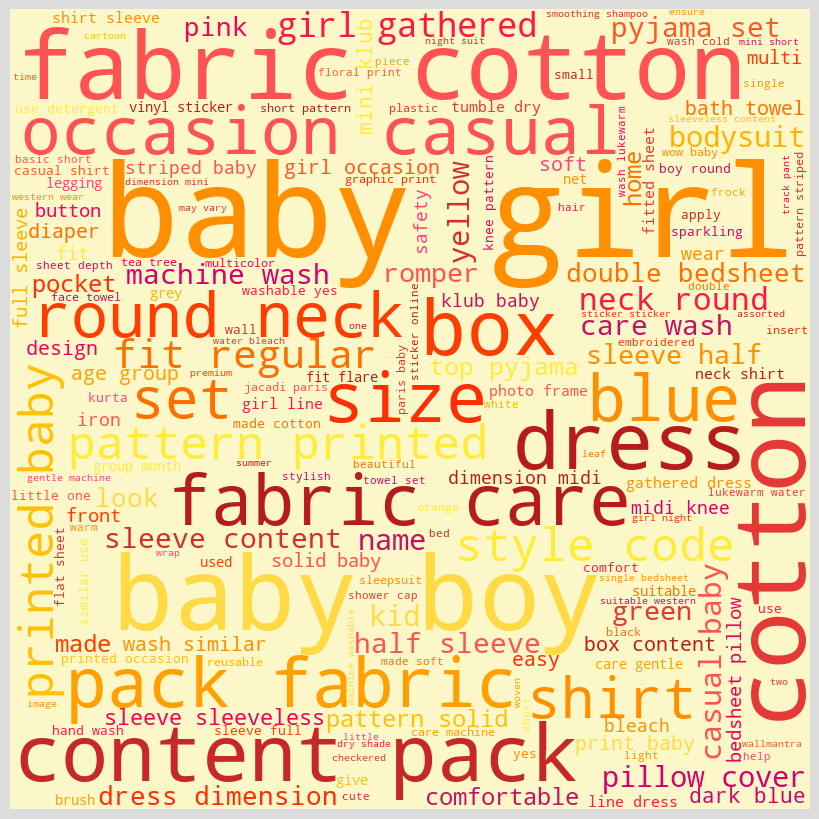

In [ ]:
baby_care_words_trim_final  = grouped_trim_final.iloc[0,1]
wordcloud_7 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(baby_care_words_trim_final))
wordcloud_7 = wordcloud_7.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_7)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

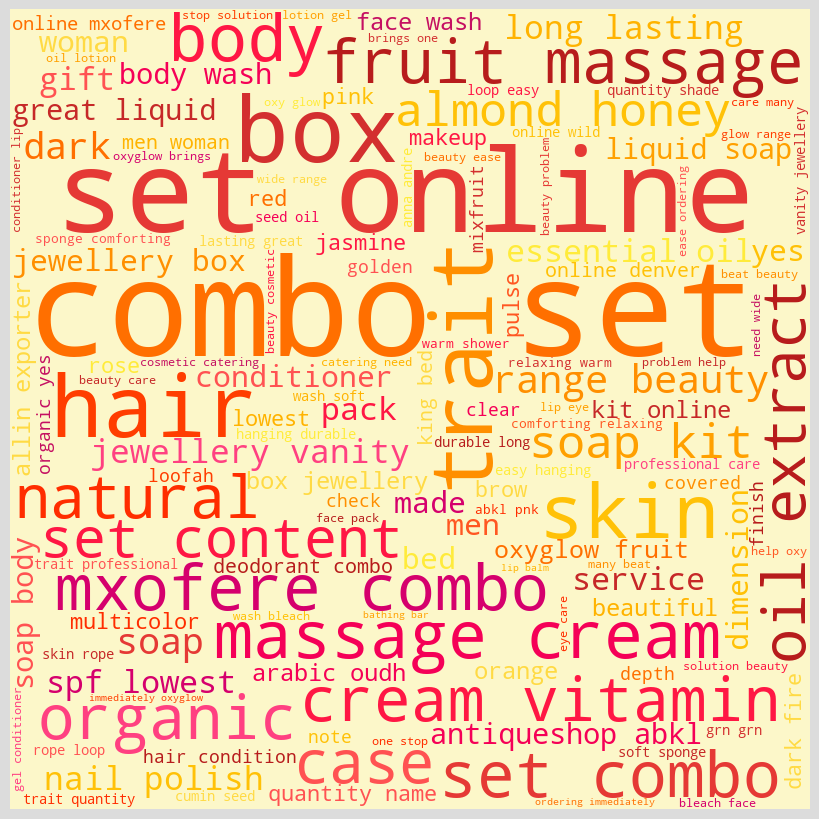

In [ ]:
beauty_words_trim_final  = grouped_trim_final.iloc[1,1]
wordcloud_8 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(beauty_words_trim_final))
wordcloud_8= wordcloud_8.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_8)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

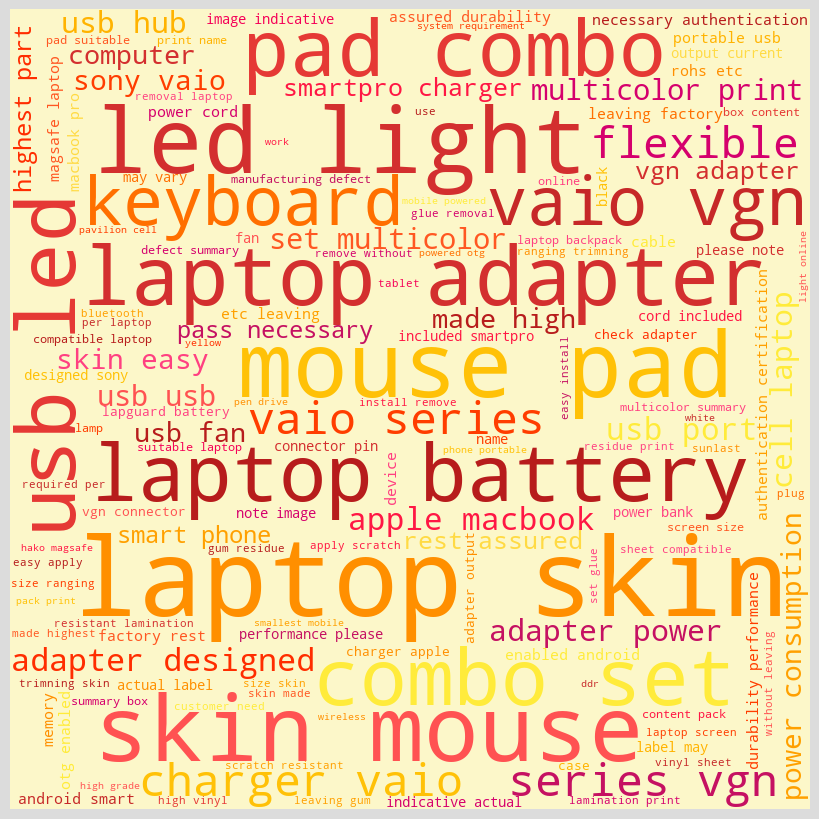

In [ ]:
computers_words_trim_final  = grouped_trim_final.iloc[2,1]
wordcloud_9 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(computers_words_trim_final))
wordcloud_9 = wordcloud_9.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_9)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

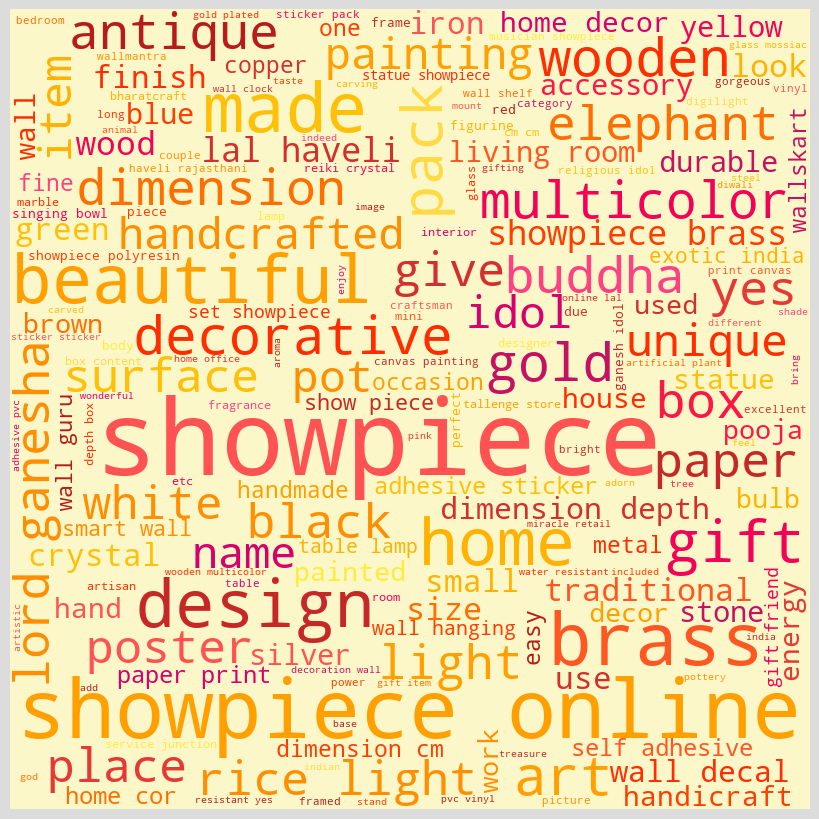

In [ ]:
home_decor_words_trim_final = grouped_trim_final.iloc[3,1]
wordcloud_10 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(home_decor_words_trim_final))
wordcloud_10= wordcloud_10.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_10)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

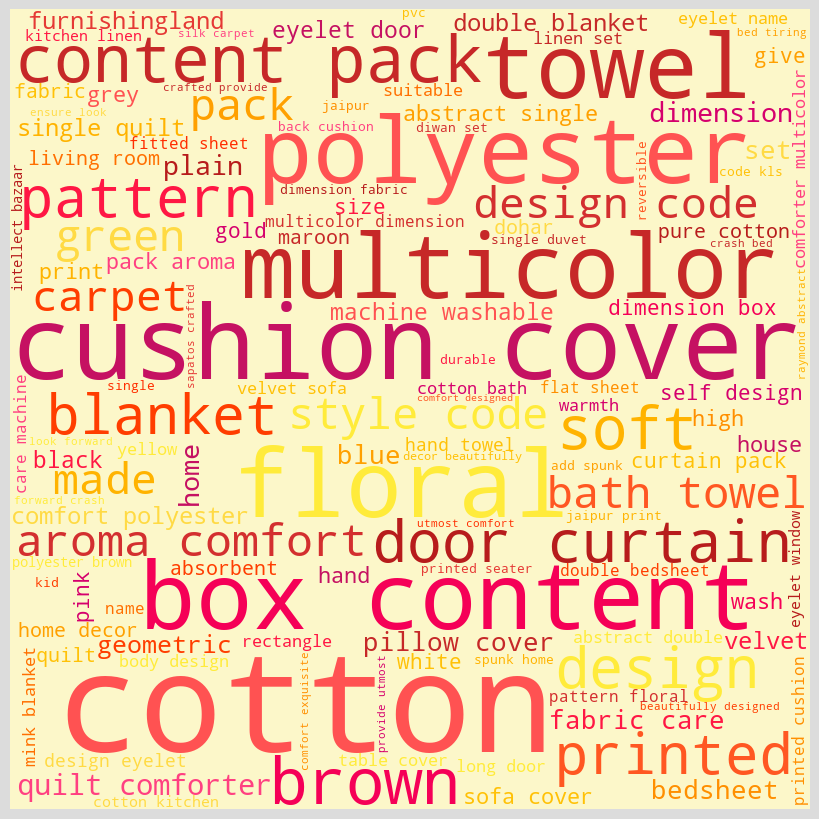

In [ ]:
home_furn_words_trim_final  = grouped_trim_final.iloc[4,1]
wordcloud_11 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(home_furn_words_trim_final))
wordcloud_11= wordcloud_11.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_11)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

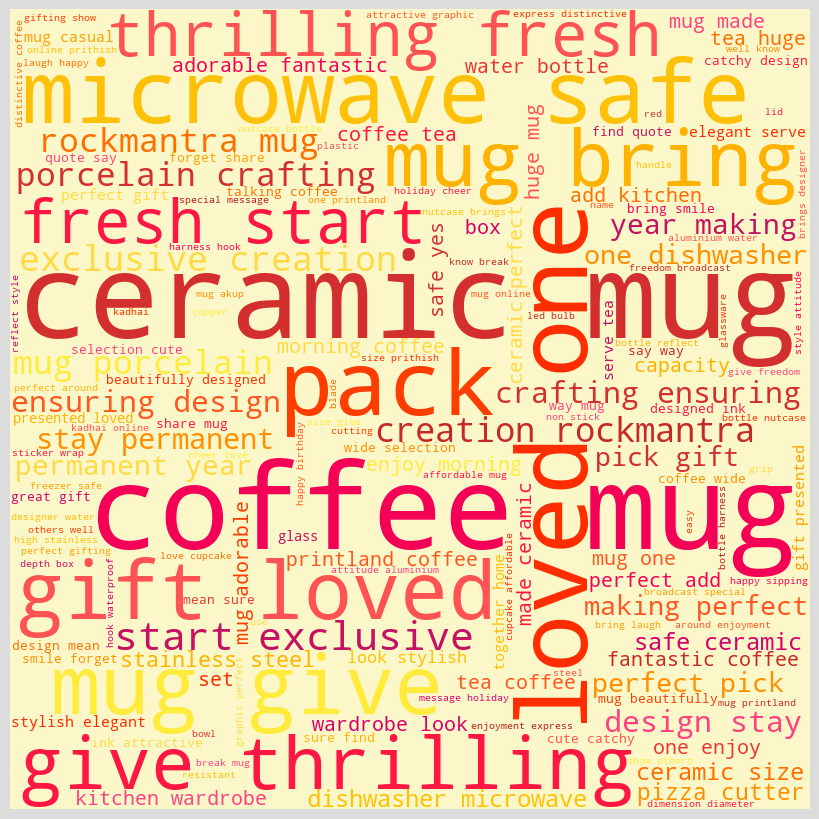

In [ ]:
kitchen_words_trim_final  = grouped_trim_final.iloc[5,1]
wordcloud_12 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(kitchen_words_trim_final))
wordcloud_12= wordcloud_12.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_12)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

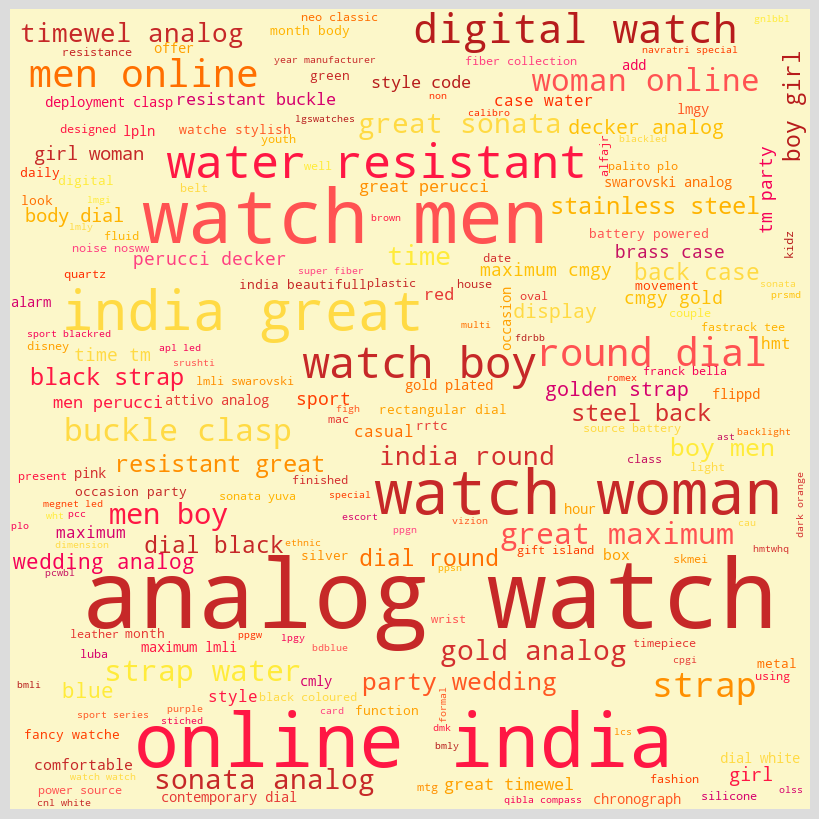

In [ ]:
watches_words_trim_final = grouped_trim_final.iloc[6,1]
wordcloud_13 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(watches_words_trim_final))
wordcloud_13= wordcloud_13.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_13)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
words_trim_all_final = baby_care_words_trim_final + beauty_words_trim_final + computers_words_trim_final + home_decor_words_trim_final \
+ home_furn_words_trim_final + kitchen_words_trim_final + watches_words_trim_final

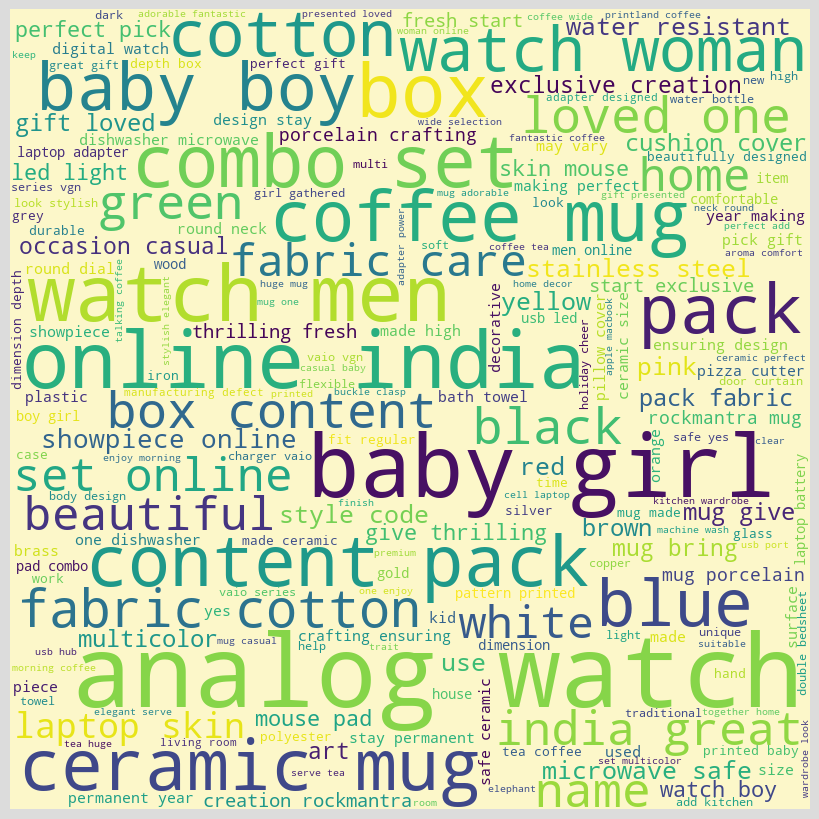

In [ ]:
wordcloud_14 = WordCloud(width=800, height=800, background_color=banana, min_font_size=10).generate(' '.join(words_trim_all_final))
# wordcloud_6 = wordcloud_6.recolor(color_func=sunset_color_func)
plt.figure(figsize=(8, 12), facecolor=None)
plt.imshow(wordcloud_14)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

 **Different models require different text pre-processing steps :**  
  Traditional models benefit from a more aggressive cleaning and normalization to reduce vocabulary size and noise, while deep learning models rely on richer context and tokenization methods, so minimal preprocessing preserves information. Preprocessing must therefore align with the model’s training data and assumptions to ensure optimal performance:  

  **- Bag of Words (BoW) models (CountVectorizer, TF-IDF, Word2Vec) require:**
   * Tokenization: to split text into words/tokens for frequency counting or embedding lookup;
   * Stopword removal: to reduce noise from very common but uninformative words;
   * Lowercasing: to unify word forms (e.g., "Apple" and "apple" treated the same);
   * (Optional) Lemmatization: to reduce and normalize words to their base form (e.g., "running" → "run"), improving vocabulary consistency and helping to reduce sparsity.  

  **- Deep Learning models (USE, BERT):**  
   * Tokenization is still needed, but stopword removal is usually skipped because these models capture context and semantics, so stopwords may carry meaning;  
   * Lowercasing depends on the model (e.g., 'bert-base-uncased' expects lowercased input);  
   * Lemmatization is generally avoided because transformers use subword tokenization and contextual embeddings, so raw forms are preferred.  

## 1.3 - Text processing functions

In [ ]:
# Sub-function to remove specific words from a list of tokens
def trim_words_fct(tokens, words_to_trim):
    words_to_trim_set = set(words_to_trim)
    return [token for token in tokens if token not in words_to_trim_set]

In [ ]:
# Text prep function for Bag-of-Words, Tf-idf & Word2Vec
def bag_of_words_transfo(word_string):
    word_tokens = tokenize(word_string)
    sw = remove_stop_words(word_tokens)
    trimmed = trim_words_fct(sw, words_to_trim)
    # lem_w = lemmatize(sw)
    transf_desc_text = ' '.join(trimmed)
    return transf_desc_text

# Text prep function for Bag-of-Words with lemmatization
def bag_of_words_transfo_lem(word_string):
    word_tokens = tokenize(word_string)
    sw = remove_stop_words(word_tokens)
    lem_w = lemmatize(sw)
    trimmed = trim_words_fct(lem_w, words_to_trim)
    transf_desc_text = ' '.join(trimmed)
    return transf_desc_text

# Text prep function for deep learning (BERT & USE)
def deep_lean_transfo(word_string) :
    word_tokens = tokenize(word_string)
    # sw = remove_stop_words(word_tokens)
    # trimmed = trim_words_fct(lem_w, words_to_trim)
    # lem_w = lemmatize(sw)
    transf_desc_text = ' '.join(word_tokens)
    return transf_desc_text

In [ ]:
products_trim['corpus_bow'] = products_trim['corpus_raw'].apply(lambda x : bag_of_words_transfo(x))
products_trim['corpus_bow_lem'] = products_trim['corpus_raw'].apply(lambda x : bag_of_words_transfo_lem(x))
products_trim['corpus_deep_learn'] = products_trim['corpus_raw'].apply(lambda x : deep_lean_transfo(x))

In [ ]:
products_trim['corpus_raw_word_count'] = products_trim['corpus_raw'].apply(lambda x: len(x.split()))
products_trim['corpus_bow_word_count'] = products_trim['corpus_bow'].apply(lambda x: len(x.split()))
products_trim['corpus_bow_lem_word_count'] = products_trim['corpus_bow_lem'].apply(lambda x: len(x.split()))
products_trim['corpus_deep_learn_word_count'] = products_trim['corpus_deep_learn'].apply(lambda x: len(x.split()))

In [ ]:
print(products_trim.columns)
print(products_trim.shape)
products_trim.head(1)

Index(['product_category', 'description', 'image', 'corpus_raw',
       'corpus_raw_word_count', 'corpus_trim', 'corpus_trim_word_count',
       'corpus_trim_unique_words', 'corpus_bow', 'corpus_bow_lem',
       'corpus_deep_learn', 'corpus_bow_word_count',
       'corpus_bow_lem_word_count', 'corpus_deep_learn_word_count'],
      dtype='object')
(1050, 14)


,product_category,description,image,corpus_raw,corpus_raw_word_count,corpus_trim,corpus_trim_word_count,corpus_trim_unique_words,corpus_bow,corpus_bow_lem,corpus_deep_learn,corpus_bow_word_count,corpus_bow_lem_word_count,corpus_deep_learn_word_count
0,Home Furnishing,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",230,"[elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, pack, curtain, enhances, look, interior, curtain, made, high, polyester, fabric, eyelet, style, stitch, metal, ring, room, environment, curtain, ant, wrinkle, anti, shrinkage, elegant, give, home, bright, appeal, design, attention, sure, heart, contemporary, eyelet, curtain, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, ray, want, wish, morning, whole, world, draw, evening, create, special, moment, beauty, given, soothing, print, bring, home, elegant, curtain, light, room, get, right, amount, sunlight, elegance, polyester, multicolor, abstract, eyelet, door, curtain, pack, elegance, designed, door, eyelet, name, abstract, polyester, ...]",112,70,features el

<AxesSubplot:>

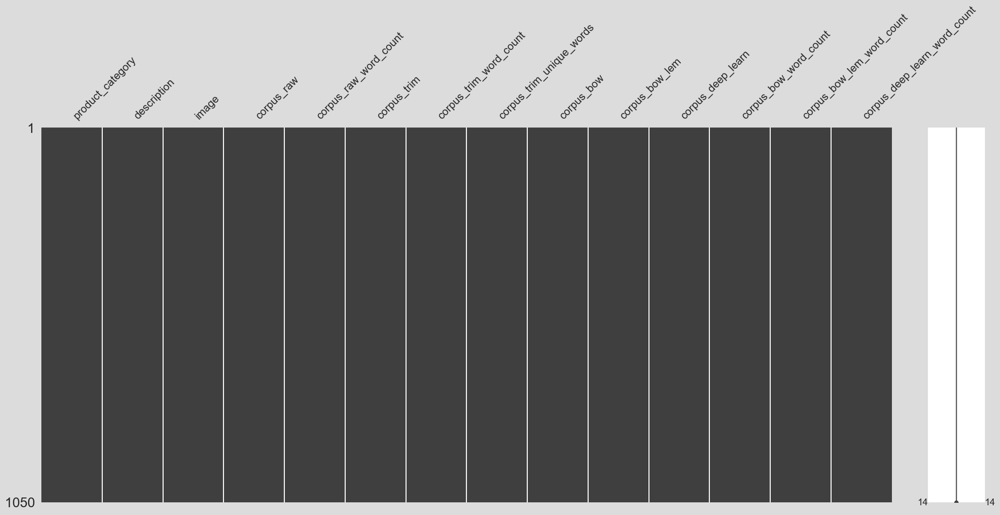

In [ ]:
msno.matrix(products_trim)

In [ ]:
products_trim.isna().sum().sum()

0

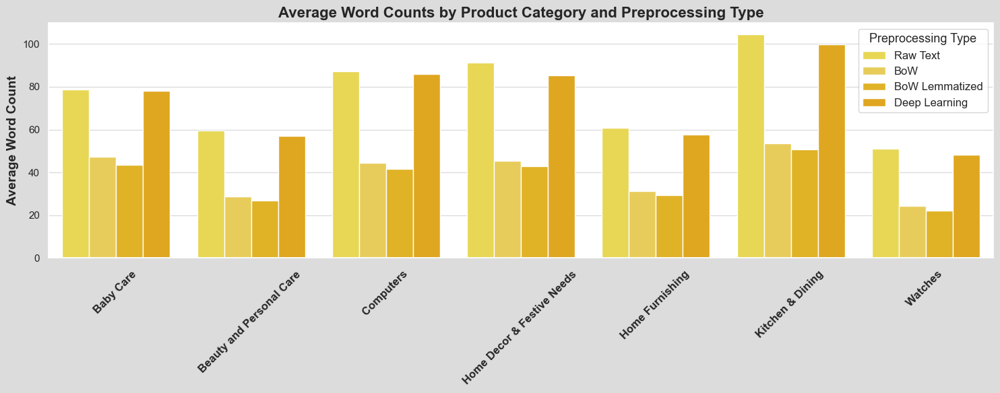

In [ ]:
# Compute averages per category for each word count column
avg_bow = products_trim.groupby('product_category')['corpus_bow_word_count'].mean().reset_index()
avg_bow_lem = products_trim.groupby('product_category')['corpus_bow_lem_word_count'].mean().reset_index()
avg_deep = products_trim.groupby('product_category')['corpus_deep_learn_word_count'].mean().reset_index()
avg_raw = products_trim.groupby('product_category')['corpus_raw_word_count'].mean().reset_index()

# Merge into one df
avg_all = avg_bow.merge(avg_bow_lem, on='product_category') \
                 .merge(avg_deep, on='product_category') \
                 .merge(avg_raw, on='product_category')

# Melt to long format
avg_long = avg_all.melt(id_vars='product_category',
                        value_vars=['corpus_raw_word_count', 'corpus_bow_word_count',
                                    'corpus_bow_lem_word_count', 'corpus_deep_learn_word_count'],
                        var_name='Word Count Type', value_name='Average Word Count')

# Rename legend & labels
avg_long['Word Count Type'] = avg_long['Word Count Type'].map({
    'corpus_raw_word_count': 'Raw Text',
    'corpus_bow_word_count': 'BoW',
    'corpus_bow_lem_word_count': 'BoW Lemmatized',
    'corpus_deep_learn_word_count': 'Deep Learning'
})

# Plot
sns.set(rc={'figure.figsize':(15, 6), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})
plt.figure(figsize=(15,6))

barplot = sns.barplot(data=avg_long, x='product_category', y='Average Word Count',
                      hue='Word Count Type', palette=sunset_palette)

# Labels and title
plt.title('Average Word Counts by Product Category and Preprocessing Type', fontsize=16, fontweight='bold')
plt.xlabel('')
plt.ylabel('Average Word Count', fontsize=14, fontweight='bold')

# Rotate x labels
plt.xticks(rotation=45, fontsize=12, fontweight='bold')

# Legend
plt.legend(title='Preprocessing Type', fontsize=12, title_fontsize=13, loc='upper right')

# Grid lines on y-axis
plt.grid(axis='y', color='gainsboro')

plt.tight_layout()
plt.savefig("grouped_word_count_by_category.png", bbox_inches='tight')
plt.show()

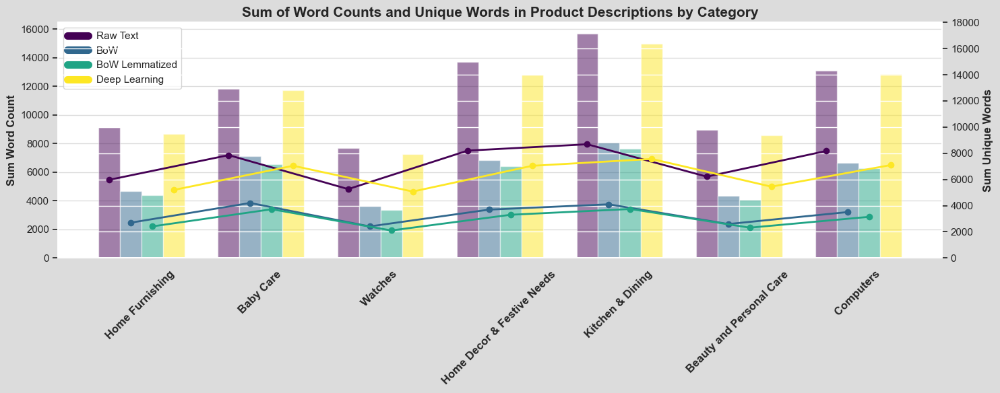

In [ ]:
custom_palette = ['#440154', '#30678d', '#20a485', '#fde724']

methods_order = ['Raw Text', 'BoW', 'BoW Lemmatized', 'Deep Learning']
method_column_map = {
    'Raw Text': ('corpus_raw_word_count', 'corpus_raw'),
    'BoW': ('corpus_bow_word_count', 'corpus_bow'),
    'BoW Lemmatized': ('corpus_bow_lem_word_count', 'corpus_bow_lem'),
    'Deep Learning': ('corpus_deep_learn_word_count', 'corpus_deep_learn')
}

def unique_word_count(text):
    if isinstance(text, str):
        return len(set(text.split()))
    else:
        return 0

for method, (wc_col, txt_col) in method_column_map.items():
    unique_col = txt_col + '_unique_words'
    products_trim[unique_col] = products_trim[txt_col].apply(unique_word_count)

plot_data = []
unique_plot_data = []
categories_order = products_trim['product_category'].unique()

for method in methods_order:
    wc_col, txt_col = method_column_map[method]
    unique_col = txt_col + '_unique_words'
    wc_sum = products_trim.groupby('product_category')[wc_col].sum().reindex(categories_order)
    unique_sum = products_trim.groupby('product_category')[unique_col].sum().reindex(categories_order)
    for cat in categories_order:
        plot_data.append({'product_category': cat, 'Method': method, 'Sum Word Count': wc_sum[cat]})
        unique_plot_data.append({'product_category': cat, 'Method': method, 'Sum Unique Words': unique_sum[cat]})

df_bars = pd.DataFrame(plot_data)
df_lines = pd.DataFrame(unique_plot_data)

sns.set(rc={'figure.figsize':(15, 6), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})
fig, ax = plt.subplots(figsize=(15, 6))

bar_width = 0.18
n_methods = len(methods_order)
n_categories = len(categories_order)
x = np.arange(n_categories)

# Plot bars with alpha=0.5 for transparency
for i, method in enumerate(methods_order):
    data = df_bars[df_bars['Method'] == method].set_index('product_category').reindex(categories_order)
    ax.bar(x + (i - 1.5) * bar_width, data['Sum Word Count'], width=bar_width,
           label=method, color=custom_palette[i], alpha=0.5)  # transparency here

ax2 = ax.twinx()
for i, method in enumerate(methods_order):
    data = df_lines[df_lines['Method'] == method].set_index('product_category').reindex(categories_order)
    ax2.plot(x + (i - 1.5) * bar_width, data['Sum Unique Words'],
             marker='o', linewidth=2, color=custom_palette[i])

# Synchronize y-axes
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
ax2.set_ylabel('Sum Unique Words', fontsize=12, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels(categories_order, rotation=45, fontweight='bold', fontsize=12)
ax.set_ylabel('Sum Word Count', fontsize=12, fontweight='bold')
ax.set_title('Sum of Word Counts and Unique Words in Product Descriptions by Category',
             fontweight='bold', fontsize=15)
ax.grid(axis='y', color='gainsboro')

# Create a legend with fully opaque color patches (alpha=1)
handles = [plt.Line2D([0], [0], color=custom_palette[i], lw=8, alpha=1) for i in range(n_methods)]
ax.legend(handles, methods_order, loc='upper left', fontsize=11)

plt.tight_layout()
plt.savefig("graph_6_grouped_bars_aligned_lines_custom_colors.png", bbox_inches='tight')
plt.show()


## 1.4 - Modelisations - Common prior steps

### 1.4.1 - Label-encoding of product categories

In [ ]:
le = LabelEncoder()
products_trim['real_clusters'] = le.fit_transform(products_trim['product_category'])
print(products_trim.shape)
# products_trim.head(1)

(1050, 19)


In [ ]:
# Create a DataFrame showing category and its numeric label
category_mapping = pd.DataFrame({
    'product_category': le.classes_,
    'category_numeric': range(len(le.classes_))
})
category_mapping

,product_category,category_numeric
0,Baby Care,0
1,Beauty and Personal Care,1
2,Computers,2
3,Home Decor & Festive Needs,3
4,Home Furnishing,4
5,Kitchen & Dining,5
6,Watches,6


In [ ]:
category_mapping.to_csv('category_mapping.csv', index=False)

In [ ]:
# products_trim.to_csv('products_trim_final.csv', index=False,  encoding='utf-8', sep='\t', )

**When written to csv, the data has random NaNs which are not in the products_trim dataframe. This issue strongly suggests the Pandas CSV format itself being fragile for this dataset, which can happen with embedded newlines or tabs, unescaped quotes, very long text fields or other special characters that could break the csv parsing. The parquet format will therefore be preferred here.**

In [ ]:
products_trim.to_parquet('products_trim_final.parquet.gzip', compression='gzip')

### 1.4.2 - Evaluation metrics

Text data (especially after vectorization or embedding) is highly non-linear and complex.

On the one hand, **t-SNE** excels at revealing local clusters and groupings in such data, which is ideal for EDA when we want to see if products from the same category cluster together.

**PCA** on the other hand may miss these subtle, non-linear relationships and will mostly show the directions of largest variance, which may not correspond to meaningful clusters for text.

See https://www.datacamp.com/tutorial/introduction-t-sne for t-SNE vs PCA use cases.  
See https://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf for 2008 t-SNE paper by Laurens van der Maaten and Geoffrey Hinton

The **Adjusted Rand Index (ARI)** is well suited for a clustering evaluation because:

- **ARI measures similarity between two clusterings:** It compares the clustering labels predicted by the algorithm (e.g., KMeans on t-SNE embeddings) with the true class labels (the product categories).
- **It adjusts for chance:** Unlike the raw Rand Index, ARI corrects for random label assignments, providing a more reliable measure of clustering quality.
- **It is label permutation invariant:** ARI does not require cluster labels to match the true labels exactly; it evaluates the agreement regardless of label numbering.
- **It handles different cluster sizes:** ARI works well even if clusters vary in size or number.
- **Interpretability:** ARI ranges from -1 (no agreement) to 1 (perfect agreement), with 0 indicating random labeling, making it easy to interpret.

In our context, where we have **known product categories as ground truth** and we want to evaluate how well the clustering on t-SNE-reduced features recovers these categories, ARI provides a robust and meaningful metric to quantify the clustering performance.

In [ ]:
# Initialize a list to store results
model_results = []

In [ ]:
max_len_bag_of_words = products_trim['corpus_bow_word_count'].max()
max_len_bag_of_words_lem = products_trim['corpus_bow_lem_word_count'].max()
max_len_deep_learn = products_trim['corpus_deep_learn_word_count'].max()
print('max_len_bag_of_words:', max_len_bag_of_words, '\n','max_len_bag_of_words_lem:', \
      max_len_bag_of_words_lem, '\n','max_len_deep_learn:', max_len_deep_learn)

max_len_bag_of_words: 295 
 max_len_bag_of_words_lem: 284 
 max_len_deep_learn: 572


In [10]:
def calc_ari(features, perplexity=30, n_components=2):
    time1 = time.time()
    num_labels = len(np.unique(y_cat_num))
    random_state = 42

    # t-SNE embedding
    tsne = manifold.TSNE(
        n_components=n_components,
        perplexity=perplexity,
        n_iter=2000,
        init='random',
        learning_rate=200,
        random_state=random_state
    )
    X_tsne = tsne.fit_transform(features)

    # UMAP embedding
    reducer = umap.UMAP(
        n_components=n_components,
        n_neighbors=15,
        min_dist=0.1,
        random_state=random_state
    )
    X_umap = reducer.fit_transform(features)

    # Clustering on t-SNE embedding
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=random_state)
    cls.fit(X_tsne)

    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_), 4)
    fit_time = np.round(time.time() - time1, 2)
    print(f"ARI: {ARI}, Time: {fit_time}s")

    return ARI, X_tsne, X_umap, cls.labels_, fit_time


### 1.4.3 - Graphing functions

In [ ]:
def find_optimum_perplexity(features):
    perplexity_range = np.arange(5, 55, 5)
    divergence = []

    for p in perplexity_range:
        model = TSNE(n_components=2, init="pca", perplexity=p, random_state=42)
        # model = TSNE(n_components=2, init="random", perplexity=p, random_state=42)
        _ = model.fit_transform(features)
        divergence.append(model.kl_divergence_)

    # Prepare data for seaborn
    data_plot = pd.DataFrame({'Perplexity': perplexity_range, 'KL Divergence': divergence})
    sns.set(rc={'figure.figsize':(6, 4), 'axes.facecolor':'white', 'figure.facecolor':'gainsboro'})

    sns.lineplot(x='Perplexity', y='KL Divergence', data=data_plot, marker="o", color=banana, linewidth=2)
    plt.title("t-SNE KL Divergence vs Perplexity")
    plt.xlabel("Perplexity Values")
    plt.ylabel("KL Divergence")
    plt.xticks(perplexity_range)
    plt.show()

    # Find perplexity with minimum divergence
    min_index = np.argmin(divergence)
    optimum_perplexity = perplexity_range[min_index]

    print(f"Optimum perplexity: {optimum_perplexity} with divergence {divergence[min_index]:.4f}")
    return optimum_perplexity


In [13]:
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI):
    """
    Visualize t-SNE embeddings colored by true categories and by cluster labels,
    using a custom color palette for both.

    Parameters:
    - X_tsne: np.ndarray of shape (n_samples, 2)
    - y_cat_num: array-like of true category numbers (ints)
    - labels: array-like of cluster numbers (ints)
    - ARI: float, Adjusted Rand Index
    - sunset_palette: list of color hex codes
    - products_trim: DataFrame with column 'real_clusters' (category names)
    """
    # Get unique category names in the order of their numeric encoding
    # (Assume y_cat_num is label-encoded so 0 maps to first unique, etc.)
    category_names = list(y_cat_num.unique())
    n_categories = len(category_names)
    n_clusters = len(np.unique(labels))

    # Ensure palette is long enough
    sunset_palette = ["#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00", "#FF5722", "#FF3D00", "#FF2D00",
                  "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081", "#F50057", "#D5006D", "#C51162"]
    palette_cat = sunset_palette * ((n_categories // len(sunset_palette)) + 1)
    palette_cluster = sunset_palette * ((n_clusters // len(sunset_palette)) + 1)

    fig = plt.figure(figsize=(15, 6))

    # Left: by true category
    ax1 = fig.add_subplot(121)
    scatter1 = ax1.scatter(
        X_tsne[:, 0], X_tsne[:, 1],
        c=y_cat_num,
        cmap=matplotlib.colors.ListedColormap(palette_cat[:n_categories]),
        s=40, alpha=0.85
    )
    # Custom legend for categories
    handles1 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cat[i], markersize=10)
                for i in range(n_categories)]
    ax1.legend(handles1, category_names, loc="best", title="Category")
    ax1.set_title('t-SNE by True Categories')

    # Right: by cluster label
    ax2 = fig.add_subplot(122)
    scatter2 = ax2.scatter(
        X_tsne[:, 0], X_tsne[:, 1],
        c=labels,
        cmap=matplotlib.colors.ListedColormap(palette_cluster[:n_clusters]),
        s=40, alpha=0.85
    )
    # Custom legend for clusters
    cluster_labels = [f'Cluster {i}' for i in range(n_clusters)]
    handles2 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cluster[i], markersize=10)
                for i in range(n_clusters)]
    ax2.legend(handles2, cluster_labels, loc="best", title="Cluster")
    ax2.set_title('t-SNE by Clusters')

    plt.suptitle(f"t-SNE Visualization | ARI: {ARI}", fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    print("ARI:", ARI)

In [14]:
def UMAP_visu_fct(X_umap, y_cat_num, labels, ARI):
    """
    Visualize UMAP embeddings colored by true categories and by cluster labels,
    using a custom color palette for both.

    Parameters:
    - X_umap: np.ndarray of shape (n_samples, 2), UMAP embedding
    - y_cat_num: array-like of true category numbers (ints)
    - labels: array-like of cluster numbers (ints)
    - ARI: float, Adjusted Rand Index
    """
    category_names = np.unique(y_cat_num)
    n_categories = len(category_names)
    n_clusters = len(np.unique(labels))

    sunset_palette = [
        "#FFEB3B", "#FFDA44", "#FFC107", "#FFB300", "#FFA000", "#FF8F00", "#FF6F00", "#FF5722", "#FF3D00", "#FF2D00",
        "#E53935", "#D32F2F", "#C62828", "#B71C1C", "#FF5252", "#FF1744", "#FF4081", "#F50057", "#D5006D", "#C51162"
    ]
    palette_cat = sunset_palette * ((n_categories // len(sunset_palette)) + 1)
    palette_cluster = sunset_palette * ((n_clusters // len(sunset_palette)) + 1)

    fig = plt.figure(figsize=(15, 6))

    # Left: by true category
    ax1 = fig.add_subplot(121)
    scatter1 = ax1.scatter(
        X_umap[:, 0], X_umap[:, 1],
        c=y_cat_num,
        cmap=matplotlib.colors.ListedColormap(palette_cat[:n_categories]),
        s=40, alpha=0.85
    )
    handles1 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cat[i], markersize=10)
                for i in range(n_categories)]
    ax1.legend(handles1, category_names, loc="best", title="Category")
    ax1.set_title('UMAP by True Categories')

    # Right: by cluster label
    ax2 = fig.add_subplot(122)
    scatter2 = ax2.scatter(
        X_umap[:, 0], X_umap[:, 1],
        c=labels,
        cmap=matplotlib.colors.ListedColormap(palette_cluster[:n_clusters]),
        s=40, alpha=0.85
    )
    cluster_labels = [f'Cluster {i}' for i in range(n_clusters)]
    handles2 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette_cluster[i], markersize=10)
                for i in range(n_clusters)]
    ax2.legend(handles2, cluster_labels, loc="best", title="Cluster")
    ax2.set_title('UMAP by Clusters')

    plt.suptitle(f"UMAP Visualization | ARI: {ARI}", fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    print("ARI:", ARI)


### 1.4.4 - Define custom stop words

In [ ]:
custom_words = list(set(stopwords.words('english'))) + words_to_trim
print(type(custom_words))
len(custom_words)

<class 'list'>


1542

# 2 - Modelisation Bag-of-Words

In [ ]:
products_trim.columns

Index(['product_category', 'description', 'image', 'corpus_raw',
       'corpus_raw_word_count', 'corpus_trim', 'corpus_trim_word_count',
       'corpus_trim_unique_words', 'corpus_bow', 'corpus_bow_lem',
       'corpus_deep_learn', 'corpus_bow_word_count',
       'corpus_bow_lem_word_count', 'corpus_deep_learn_word_count',
       'corpus_raw_unique_words', 'corpus_bow_unique_words',
       'corpus_bow_lem_unique_words', 'corpus_deep_learn_unique_words',
       'real_clusters'],
      dtype='object')

In [ ]:
# data_T = pd.read_csv('products_trim_final.csv',  encoding='utf-8', sep='\t', )
data_T = pd.read_parquet('products_trim_final.parquet.gzip')
feat = 'corpus_bow_lem'

In [ ]:
data_T.columns

Index(['product_category', 'description', 'image', 'corpus_raw',
       'corpus_raw_word_count', 'corpus_trim', 'corpus_trim_word_count',
       'corpus_trim_unique_words', 'corpus_bow', 'corpus_bow_lem',
       'corpus_deep_learn', 'corpus_bow_word_count',
       'corpus_bow_lem_word_count', 'corpus_deep_learn_word_count',
       'corpus_raw_unique_words', 'corpus_bow_unique_words',
       'corpus_bow_lem_unique_words', 'corpus_deep_learn_unique_words',
       'real_clusters'],
      dtype='object')

In [ ]:
y_cat_num = data_T['real_clusters']

<AxesSubplot:>

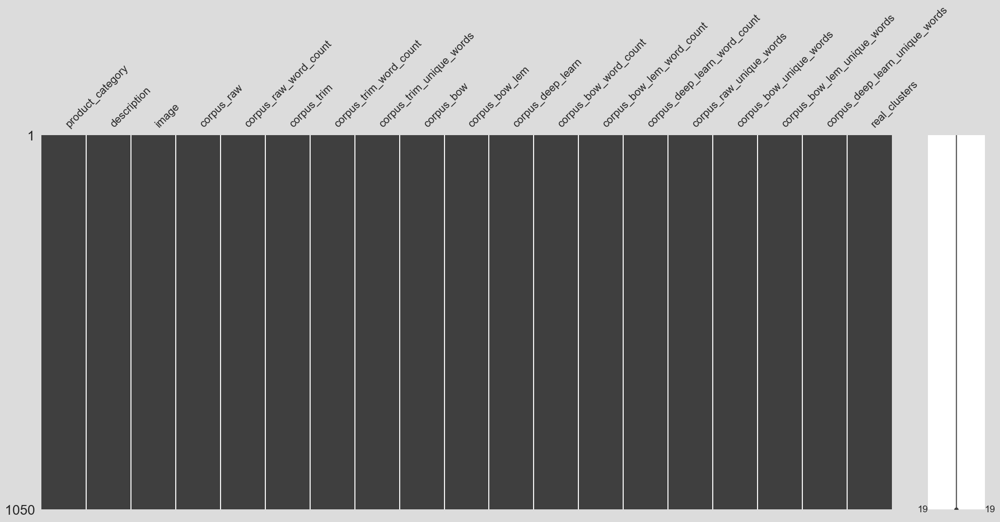

In [ ]:
msno.matrix(data_T)

## 2.1 - Count vectorizer

- **stop_words=custom_words**: This parameter takes a list or set of words that we want to exclude from the vocabulary because they are considered uninformative or irrelevant for the analysis. These "stop words" are filtered out during tokenization to reduce noise in the data ;

- **max_df=0.95**: This sets an upper threshold for the document frequency of words. Words that appear in more than 95% of the documents will be ignored. This helps remove very common words that do not help distinguish documents, such as extremely frequent terms or corpus-specific stop words. The value can be a float (proportion of documents) or an integer (absolute count) ;

- **min_df=1**: This sets a lower threshold for the document frequency of words. Words that appear in fewer than 1 document will be ignored. Since 1 means a word must appear in at least one document, effectively no words are filtered out by this parameter here. Like max_df, it can be a float (proportion) or an integer (count).

In summary, this configuration removes words that are in our custom stop word list and ignores words appearing in more than 95% of documents, while keeping all words that appear in at least one document.

In [ ]:
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1) # ARI: 0.4167, Time: 5.57s
# cvect = CountVectorizer(stop_words=custom_words, max_df=0.95, min_df=1) # ARI: 0.3921, Time: 5.96s

In [ ]:
cv_fit = cvect.fit(data_T[feat])

In [ ]:
cv_transform = cvect.transform(data_T[feat])
cv_transform.shape

(1050, 3060)

In [ ]:
voc_cv = cvect.get_feature_names_out()
voc_cv_df = pd.DataFrame(cv_transform.todense(), columns=voc_cv )
print(voc_cv_df.shape)
voc_cv_df.head()

(1050, 3060)


aapno  aari  ability  abkl  able  abode  abroad  absorbency  absorbent  \
0      0     0        0     0     0      0       0           0          0   
1      0     0        0     0     0      0       0           0          0   
2      0     0        0     0     0      0       0           1          0   
3      0     0        0     0     0      0       0           0          0   
4      0     0        0     0     0      0       0           0          0   

   absorbing  abstract  accent  access  accessory  accident  accidental  \
0          0         4       0       0          0         0           0   
1          0         0       0       0          0         0           0   
2          0         0       0       0          0         0           0   
3          0         0       0       0          0         0           0   
4          0         0       0       0          0         0           0   

   according  ache  aci  acid  acne  acrylic  act  active  actual  adaa  \
0          0     0    0     0     0        0    0       0       0     0   
1          0     0    0     0     0        0    0       0       0     0   
2          0     0    0     0     0        0    0       0       0     0   
3          0     0    0     0     0        0    0       0       0     0   
4          0     0    0     0     0        0    0       0       0     0   

   adapter  adaptor  add  adding  addition  adf  adhesive  adi  adidas  \
0        0        0    0       0         0    0         0    0       0   
1        0        0    0       0         0    0         0    0       0   
2        0        0    0       0         0    0         0    0       0   
3        0        0    0       0         0    0         0    0       0   
4        0        0    0       0         0    0         0    0       0   

   adjustable  adjusts  admiration  admired  adorable  adorn  adorned  \
0           0        0           0        0         0      0        0   
1           0        0           0        0         0      0        0   
2           0        0           0        0         0      0        0   
3           0        0           0        0         0      0        0   
4           0        0           0        0         0      0        0   

   adorning  adsl  advance  advice  aero  affect  affordable  afternoon  age  \
0         0     0        0       0     0       0           0          0    0   
1         0     0        0       0     0       0           0          0    0   
2         0     0        0       0     0       0           0          0    0   
3         0     0        0       0     0       0           0          0    0   
4         0     0        0       0     0       0           0          0    0   

   aging  agrasen  agromech  aid  aiding  air  airtex  airtight  akada  \
0      0        0         0    0       0    0       0         0      0   
1      0        0         0    0       0    0       0         0      0   
2      0        0         0    0       0    0       0         0      0   
3      0        0         0    0       0    0       0         0      0   
4      0        0         0    0       0    0       0         0      0   

   akshaj  akup  alarm  aleo  alfajr  allin  allow  allowed  allowing  allows  \
0       0     0      0     0       0      0      0        0         0       0   
1       0     0      0     0       0      0      0        0         0       0   
2       0     0      0     0       0      0      0        0         0       0   
3       0     0      0     0       0      0      0        0         0       0   
4       0     0      0     0       0      0      0        0         0       0   

   alloy  alluring  ally  almond  aloe  aloevera  alternative  alternatively  \
0      0         0     0       0     0         0            0              0   
1      0         0     0       0     0         0            0              0   
2      0         0     0       0     0         0            0              0   
3      0         0   

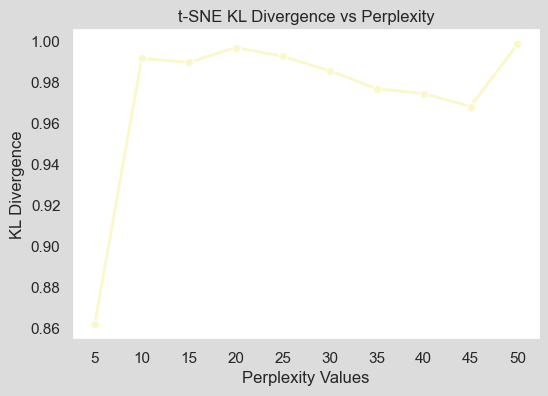

Optimum perplexity: 5 with divergence 0.8619


In [ ]:
opt_perplexity_cv = find_optimum_perplexity(voc_cv_df)

In [ ]:
# ARI_cv, X_tsne_cv, labels_cv, fit_time_cv = calc_ari(cv_transform, opt_perplexity_cv) # ARI: 0.3537, Time: 4.18s for both random and pca inits
ARI_cv, X_tsne_cv, X_umap_cv, labels_cv, fit_time_cv = calc_ari(cv_transform)
model_results.append({'Model': 'CV', 'ARI': ARI_cv,'Fitting Time (s)': fit_time_cv})

ARI: 0.4167, Time: 16.09s


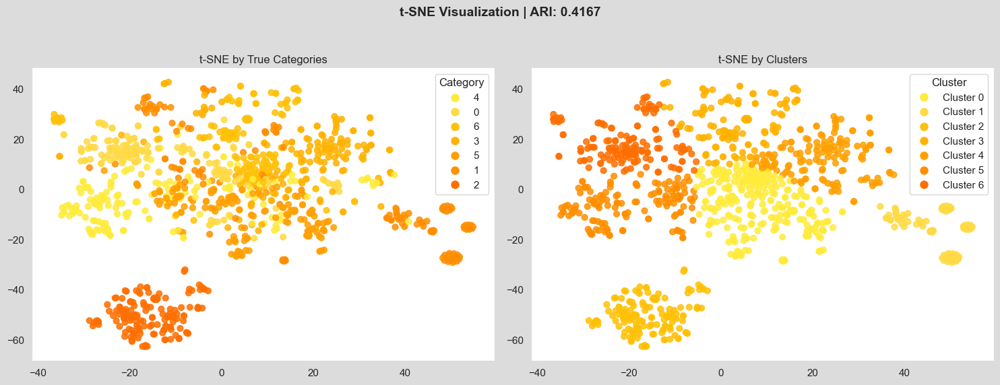

ARI: 0.4167


In [ ]:
TSNE_visu_fct(X_tsne_cv, y_cat_num, labels_cv, ARI_cv)

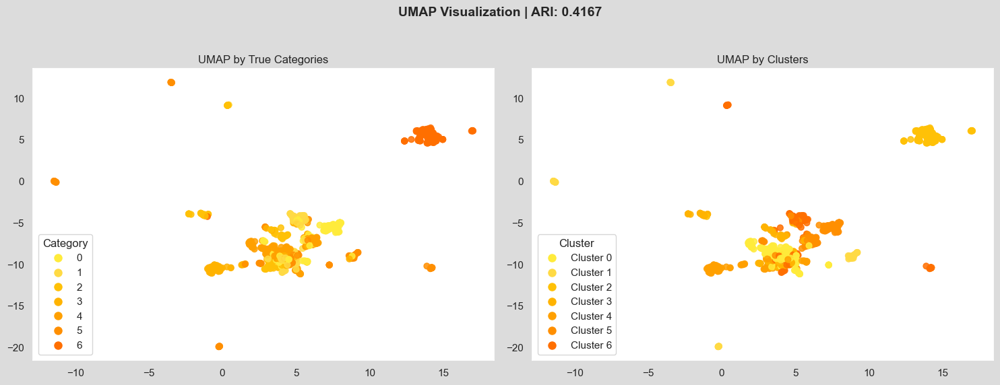

ARI: 0.4167


In [ ]:
UMAP_visu_fct(X_umap_cv, y_cat_num, labels_cv, ARI_cv)

## 2.2 - Tf-idf

- **stop_words='english'**  
  This tells the vectorizer to use a built-in list of English stop words. These are common words like "the", "and", "is", etc., which are usually not helpful for distinguishing documents and are therefore removed from the text before vectorization.

- **max_df=0.95**  
  This parameter sets an upper limit on the document frequency of terms. Any term that appears in more than 95% of the documents will be ignored. This helps filter out very common words that don't provide meaningful information for the analysis.

- **min_df=1**  
  This sets a lower limit on the document frequency of terms. Terms that appear in fewer than 1 document (i.e., zero documents) will be ignored. Since 1 means a term must appear in at least one document, effectively no terms are filtered out based on minimum frequency here.

In [ ]:
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1) # ARI: 0.5636, Time: 4.46s
# ctf = TfidfVectorizer(stop_words=custom_words, max_df=0.95, min_df=1) # ARI: 0.5501, Time: 4.28s

In [ ]:
ctf_fit = ctf.fit(data_T[feat])

In [ ]:
ctf_transform = ctf.transform(data_T[feat])

In [ ]:
voc_ctf = ctf.get_feature_names_out()
voc_ctf_df = pd.DataFrame(ctf_transform.todense(), columns=voc_ctf)
print(voc_ctf_df.shape)
voc_ctf_df.head()

(1050, 3060)


aapno  aari  ability  abkl  able  abode  abroad  absorbency  absorbent  \
0  0.000 0.000    0.000 0.000 0.000  0.000   0.000       0.000      0.000   
1  0.000 0.000    0.000 0.000 0.000  0.000   0.000       0.000      0.000   
2  0.000 0.000    0.000 0.000 0.000  0.000   0.000       0.067      0.000   
3  0.000 0.000    0.000 0.000 0.000  0.000   0.000       0.000      0.000   
4  0.000 0.000    0.000 0.000 0.000  0.000   0.000       0.000      0.000   

   absorbing  abstract  accent  access  accessory  accident  accidental  \
0      0.000     0.181   0.000   0.000      0.000     0.000       0.000   
1      0.000     0.000   0.000   0.000      0.000     0.000       0.000   
2      0.000     0.000   0.000   0.000      0.000     0.000       0.000   
3      0.000     0.000   0.000   0.000      0.000     0.000       0.000   
4      0.000     0.000   0.000   0.000      0.000     0.000       0.000   

   according  ache   aci  acid  acne  acrylic   act  active  actual  adaa  \
0      0.000 0.000 0.000 0.000 0.000    0.000 0.000   0.000   0.000 0.000   
1      0.000 0.000 0.000 0.000 0.000    0.000 0.000   0.000   0.000 0.000   
2      0.000 0.000 0.000 0.000 0.000    0.000 0.000   0.000   0.000 0.000   
3      0.000 0.000 0.000 0.000 0.000    0.000 0.000   0.000   0.000 0.000   
4      0.000 0.000 0.000 0.000 0.000    0.000 0.000   0.000   0.000 0.000   

   adapter  adaptor   add  adding  addition   adf  adhesive   adi  adidas  \
0    0.000    0.000 0.000   0.000     0.000 0.000     0.000 0.000   0.000   
1    0.000    0.000 0.000   0.000     0.000 0.000     0.000 0.000   0.000   
2    0.000    0.000 0.000   0.000     0.000 0.000     0.000 0.000   0.000   
3    0.000    0.000 0.000   0.000     0.000 0.000     0.000 0.000   0.000   
4    0.000    0.000 0.000   0.000     0.000 0.000     0.000 0.000   0.000   

   adjustable  adjusts  admiration  admired  adorable  adorn  adorned  \
0       0.000    0.000       0.000    0.000     0.000  0.000    0.000   
1       0.000    0.000       0.000    0.000     0.000  0.000    0.000   
2       0.000    0.000       0.000    0.000     0.000  0.000    0.000   
3       0.000    0.000       0.000    0.000     0.000  0.000    0.000   
4       0.000    0.000       0.000    0.000     0.000  0.000    0.000   

   adorning  adsl  advance  advice  aero  affect  affordable  afternoon   age  \
0     0.000 0.000    0.000   0.000 0.000   0.000       0.000      0.000 0.000   
1     0.000 0.000    0.000   0.000 0.000   0.000       0.000      0.000 0.000   
2     0.000 0.000    0.000   0.000 0.000   0.000       0.000      0.000 0.000   
3     0.000 0.000    0.000   0.000 0.000   0.000       0.000      0.000 0.000   
4     0.000 0.000    0.000   0.000 0.000   0.000       0.000      0.000 0.000   

   aging  agrasen  agromech   aid  aiding   air  airtex  airtight  akada  \
0  0.000    0.000     0.000 0.000   0.000 0.000   0.000     0.000  0.000   
1  0.000    0.000     0.000 0.000   0.000 0.000   0.000     0.000  0.000   
2  0.000    0.000     0.000 0.000   0.000 0.000   0.000     0.000  0.000   
3  0.000    0.000     0.000 0.000   0.000 0.000   0.000     0.000  0.000   
4  0.000    0.000     0.000 0.000   0.000 0.000   0.000     0.000  0.000   

   akshaj  akup  alarm  aleo  alfajr  allin  allow  allowed  allowing  allows  \
0   0.000 0.000  0.000 0.000   0.000  0.000  0.000    0.000     0.000   0.000   
1   0.000 0.000  0.000 0.000   0.000  0.000  0.000    0.000     0.000   0.000   
2   0.000 0.000  0.000 0.000   0.000  0.000  0.000    0.000     0.000   0.000   
3   0.000 0.000  0.000 0.000   0.000  0.000  0.000    0.000     0.000   0.000   
4   0.000 0.000  0.000 0.000   0.000  0.000  0.000    0.000     0.000   0.000   

   alloy  alluring  ally  almond  aloe  aloevera  alternative  alternatively  \
0  0.000     0.000 0.000   0.000 0.000     0.000        0.000          0.000   
1  0.000     0.000 0.000   0.000 0.000     0.000        0.000          0.000   
2  0.000     0.000 0.000   0.000 0.000     0.000     

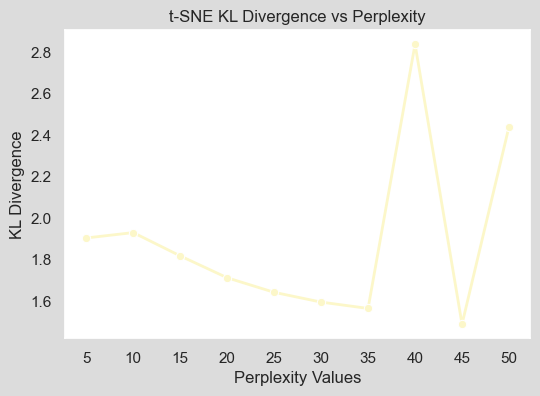

Optimum perplexity: 45 with divergence 1.4877


In [ ]:
opt_perplexity_ctf = find_optimum_perplexity(voc_ctf_df)

In [ ]:
# ARI_ctf, X_tsne_ctf, labels_ctf, fit_time_ctf  = calc_ari(ctf_transform, opt_perplexity_ctf) # ARI: 0.4532, Time: 6.02s for both random and pca inits
ARI_ctf, X_tsne_ctf, X_umap_ctf, labels_ctf, fit_time_ctf  = calc_ari(ctf_transform)
model_results.append({'Model': 'Tf-idf', 'ARI': ARI_ctf, 'Fitting Time (s)': fit_time_ctf})

ARI: 0.5636, Time: 7.46s


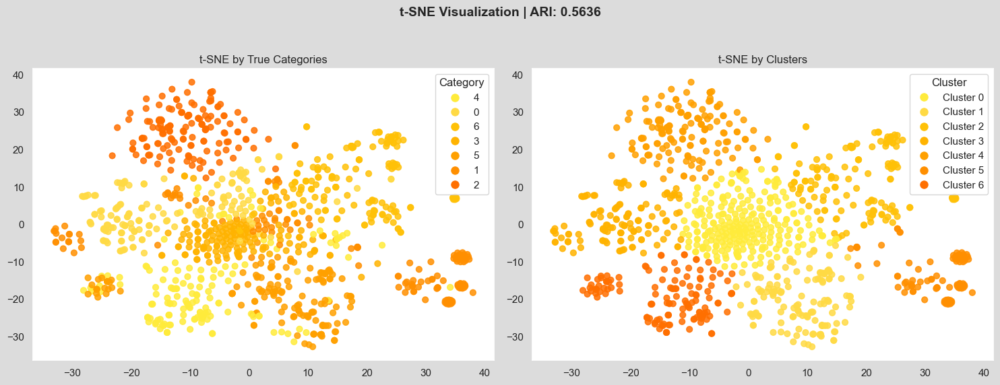

ARI: 0.5636


In [ ]:
TSNE_visu_fct(X_tsne_ctf, y_cat_num, labels_ctf, ARI_ctf)

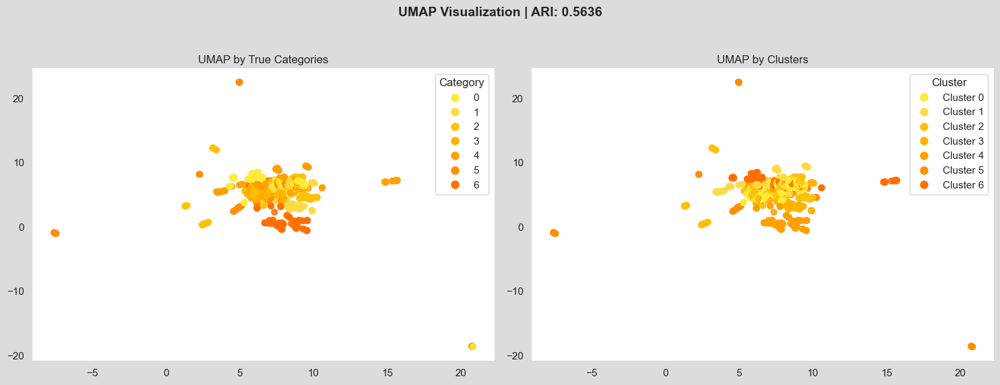

ARI: 0.5636


In [ ]:
UMAP_visu_fct(X_umap_ctf, y_cat_num, labels_ctf, ARI_ctf)

# 3 - Modelisation Word2Vec

## 3.1 - Create Word2Vec model

In [ ]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
# maxlen = 24 # adapt to length of sentences
maxlen = 285
sentences = data_T[feat].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [ ]:
# Create & train model
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 3151
Word2Vec trained


In [ ]:
# Prepare sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post')

num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 3152


## 3.2 - Create embedding matrix

In [ ]:
print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0

for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]

word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (3152, 300)


## 3.3 - Create embedding model

In [ ]:
input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 285)]             0         
                                                                 
 embedding (Embedding)       (None, 285, 300)          945600    
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 945,600
Trainable params: 945,600
Non-trainable params: 0
_________________________________________________________________


## 3.4 - Execute model

In [ ]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 807us/step


(1050, 300)

In [ ]:
ARI_w2v, X_tsne_w2v, X_umap_w2v, labels_w2v, fit_time_w2v = calc_ari(embeddings)
model_results.append({
    'Model': 'Word2Vec',
    'ARI': ARI_w2v,
    'Fitting Time (s)': fit_time_w2v
})

ARI: 0.5317, Time: 9.82s


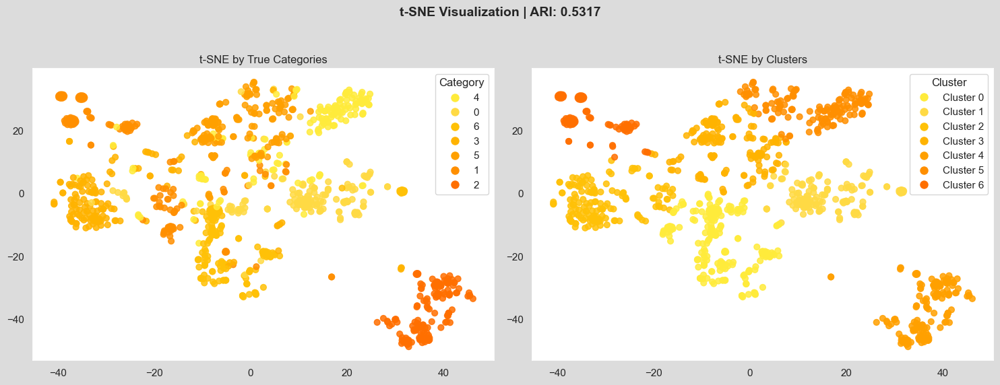

ARI: 0.5317


In [ ]:
TSNE_visu_fct(X_tsne_w2v, y_cat_num, labels_w2v, ARI_w2v)

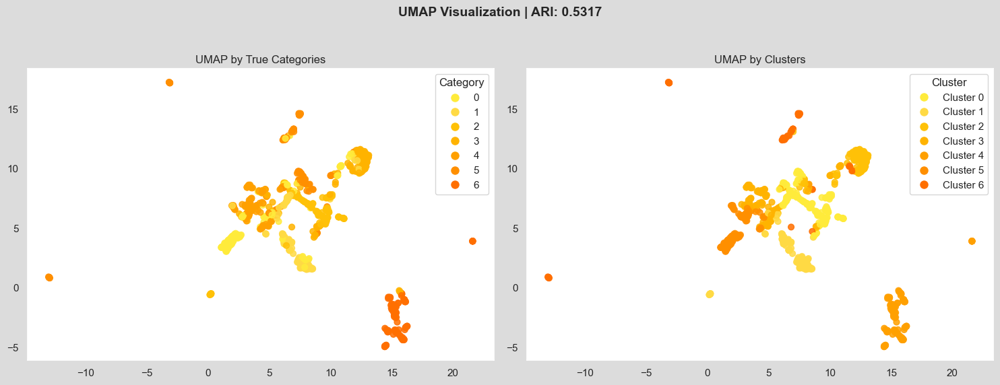

ARI: 0.5317


In [ ]:
UMAP_visu_fct(X_umap_w2v, y_cat_num, labels_w2v, ARI_w2v)

# 4 - BERT with Tensorflow hub

In [ ]:
sentences = data_T['corpus_deep_learn'].to_list()

## 4.1 - Create function

In [ ]:
# Prepare sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True,
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")

        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0],
                             bert_inp['token_type_ids'][0],
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)

    return input_ids, token_type_ids, attention_mask, bert_inp_tot


# Create features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size],
                                                                      bert_tokenizer, max_length)

        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids,
                                 "input_mask" : attention_mask,
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']

        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))

    features_bert = np.array(last_hidden_states_tot).mean(axis=1)

    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)

    return features_bert, last_hidden_states_tot

## 4.2 - Create model

In [ ]:
# cf tuto at : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [ ]:
max_length = 512
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences,
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  7.0


In [ ]:
ARI_bert, X_tsne_bert, X_umap_bert, labels_bert, fit_time_bert = calc_ari(features_bert)
model_results.append({
    'Model': 'BERT',
    'ARI': ARI_bert,
    'Fitting Time (s)': fit_time_bert
})

ARI: 0.3388, Time: 7.4s


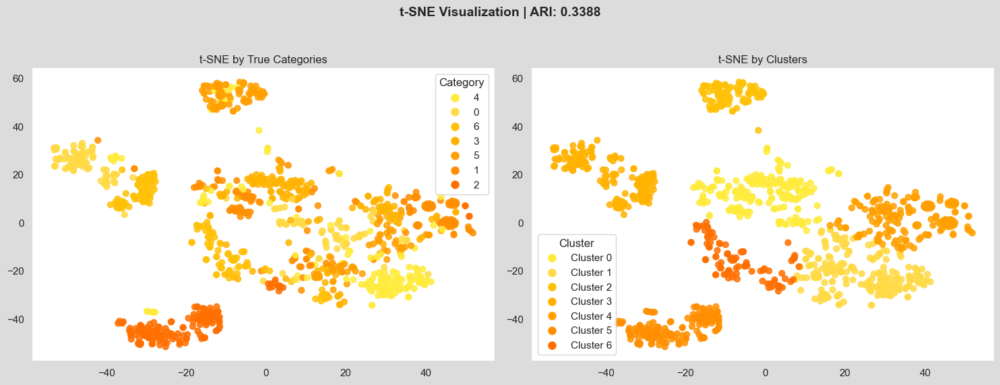

ARI: 0.3388


In [ ]:
TSNE_visu_fct(X_tsne_bert, y_cat_num, labels_bert, ARI_bert)

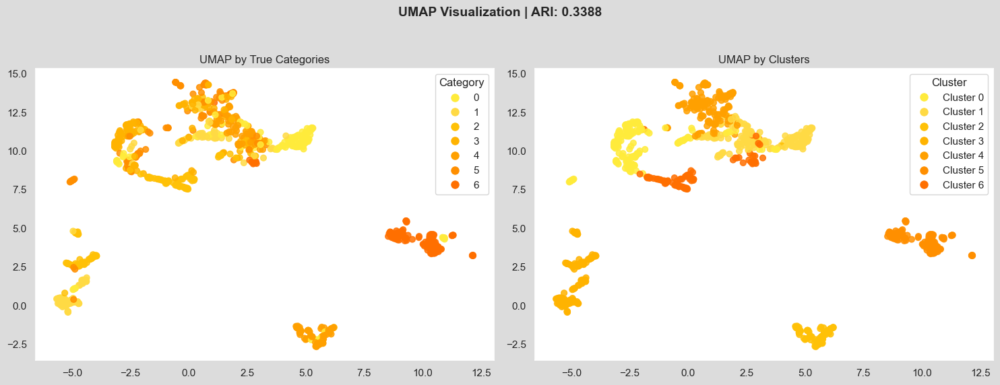

ARI: 0.3388


In [ ]:
UMAP_visu_fct(X_umap_bert, y_cat_num, labels_bert, ARI_bert)

# 5 - USE - Universal Sentence Encoder

**Section below runs in Google Colab only (USE is not compatible with Windows environments).**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
path = '/content/drive/My Drive/Colab Notebooks/OCDS_P6/'

In [4]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
# embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-lite/2")

batch_size = 10

In [5]:
data_T = pd.read_parquet(path +'products_trim_final.parquet.gzip')
y_cat_num = data_T['real_clusters']

In [6]:
sentences = data_T['corpus_deep_learn'].to_list()

In [7]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [8]:
features_USE = feature_USE_fct(sentences, batch_size)

In [11]:
ARI_use, X_tsne_use, X_umap_use, labels_use, fit_time_use = calc_ari(features_USE)

# model_results.append({
#     'Model': 'USE',
#     'ARI': ARI_use,
#     'Fitting Time (s)': fit_time_use
# })

ARI: 0.4481, Time: 22.27s


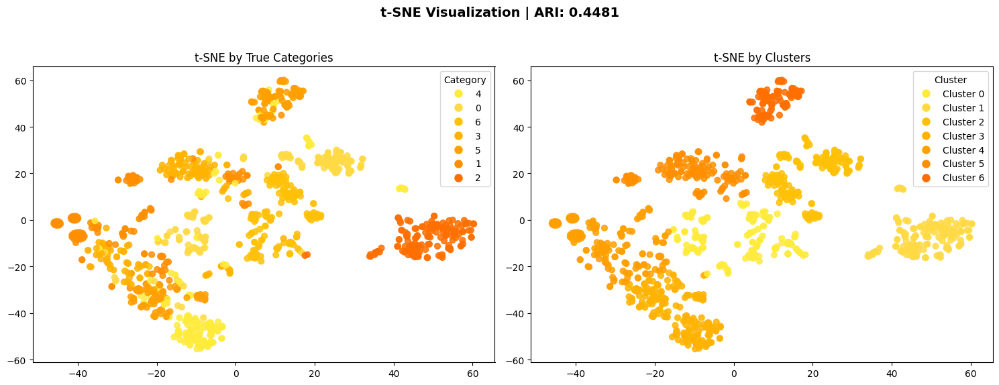

ARI: 0.4481


<Figure size 640x480 with 0 Axes>

In [15]:
TSNE_visu_fct(X_tsne_use, y_cat_num, labels_use, ARI_use)
plt.savefig('/content/drive/My Drive/Colab Notebooks/OCDS_P6/TSNE_USE.png')
plt.show()

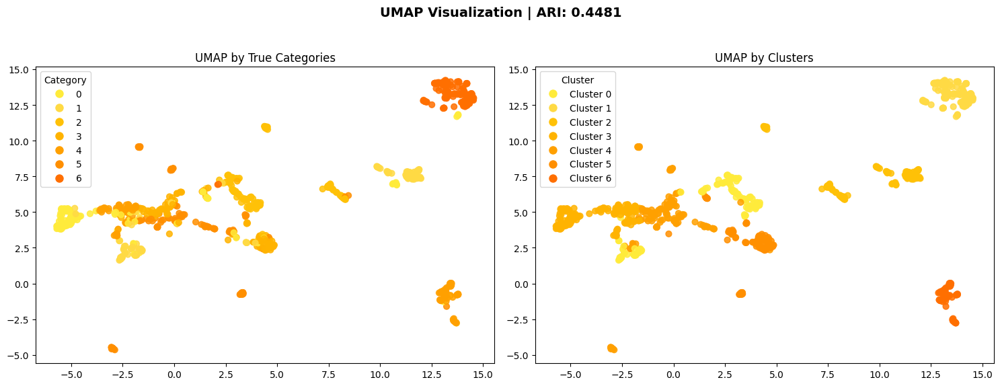

ARI: 0.4481


<Figure size 640x480 with 0 Axes>

In [16]:
UMAP_visu_fct(X_umap_use, y_cat_num, labels_use, ARI_use)
plt.savefig('/content/drive/My Drive/Colab Notebooks/OCDS_P6/UMAP_USE.png')
plt.show()

# 6 - Summarize & export results

In [ ]:
df_summary = pd.DataFrame(model_results)
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
filename = f'df_summary_{timestamp}.csv'
df_summary.to_csv(filename, index=False)
df_summary

,Model,ARI,Fitting Time (s)
0,CV,0.417,16.090
1,CV_3d,0.456,13.410
2,Tf-idf,0.564,7.460
3,Word2Vec,0.532,9.820
4,BERT,0.339,7.400


+ ARI: 0.4481, Time: 22.27s for USE

**Tf-idf gives both the fastest processing time and the best K-Means clustering results on the extracted features.**

In [2]:
import pandas as pd
df_summary = pd.read_csv('model_results_initiaux.csv')
df_summary

,Model,ARI,Fitting Time (s)
0,CV,0.4167,6.07
1,Tf-idf,0.5636,4.88
2,Word2Vec,0.4868,6.15
3,BERT,0.3388,5.18
4,USE,0.4435,20.00


In [3]:
df_summary = pd.DataFrame(model_results)
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
filename = f'df_summary_{timestamp}.csv'
df_summary.to_csv(filename, index=False)
df_summary

,Model,ARI,Fitting Time (s)
0,CV,0.4167,16.09
1,Tf-idf,0.5636,7.46
2,Word2Vec,0.5317,9.82
3,BERT,0.3388,7.40
4,USE,0.4481,22.27
